# Time series data science project

- **Chess players patterns discovery and analysis**
- **ariel-zil**

## Part 3 : classifier

In this section we will use the best clustering result from previous section to create a classifer that predicts skill changes after 3 months based on 9 months games

### 1. Imports

#### 1.1. Import packages

In [1]:
from dotenv import find_dotenv, load_dotenv
import os
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from tslearn.clustering import TimeSeriesKMeans
import time
from sklearn import metrics
from tslearn.clustering import TimeSeriesKMeans
from tslearn.clustering import silhouette_score
import numpy as np
from warnings import filterwarnings
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from tslearn.utils import to_time_series_dataset
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from collections import Counter
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from matplotlib import rcParams
from dotenv import find_dotenv, load_dotenv
import os
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from warnings import filterwarnings
import pickle

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score

from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import seaborn as sns  
from datetime import datetime, timezone
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import shap
filterwarnings("ignore")


%matplotlib inline
%config InlineBackend.figure_format = 'retina'
rcParams['figure.figsize'] = 10,6
base_color = sb.color_palette()[0]




filterwarnings("ignore")

#### 1.2. enviroment variables loading

In [2]:
PROJECT_PATH=os.getenv('PROJECT_PATH')
NUMBER_OF_GAMES_MINIMUM=int(os.getenv('NUMBER_OF_GAMES_MINIMUM'))
FICS_MIN_YEAR=int(os.getenv('FICS_MIN_YEAR'))
FICS_MAX_YEAR=int(os.getenv('FICS_MAX_YEAR'))
MAX_K=int(os.getenv('MAX_K'))

#### 1.3. Load dataset

In [77]:
df_interval=pd.read_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-blitz-rated-vfinal-players-interval-90-euclidan-cluster.csv")
df_interval["Label"]=df_interval["EuclidanClusterSSID"]
df_interval=df_interval.drop("EuclidanClusterSSID",axis=1)
df_interval=df_interval.drop("EuclidanClusterMMID",axis=1)
df_interval.index=df_interval["Unnamed: 0"]
df_interval=df_interval.drop("Unnamed: 0",axis=1)

### 2. clasification

### 2.1. using samples as interval (take 9 months and predict results after another 3 months)

In [33]:
def classify(df,test_size,model,name):
    train, test = train_test_split(df, test_size=test_size)
    y_train, y_test = train['Label'], test['Label']
    X_train, X_test = train.drop('Label', axis=1), test.drop('Label', axis=1)
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    print("Model name:",name)
    print("accuracy_score:",accuracy_score(y_test,y_predict))
    print("roc_auc_score:",roc_auc_score(y_test,y_predict))
    print("precision_score:",precision_score(y_test,y_predict))
    print("f1_score:",f1_score(y_test,y_predict))
    display( RocCurveDisplay.from_estimator(model, X_test, y_test))
    plt.show()
    try:
        explainer = shap.Explainer(model)
        shap_values = explainer.shap_values(X_test)
        shap.summary_plot(shap_values, X_test)
    except Exception as err:
        pass
    return {
        'model':model,
        'accuracy':accuracy_score(y_test,y_predict),
        'precision':precision_score(y_test,y_predict),
        'recall':recall_score(y_test,y_predict),
        'f1':f1_score(y_test,y_predict),
        'name':name
           }

In [73]:
def label_trend(labels):
    mapping={
        0:"same",
        1:"worse",
        2:"improve",
        3:"improve",
        4:"same",
        5:"worse",
        6:"same",
        7:"same",
        8:"same",
        9:"same",
        10:"same",
        11:"worse",
        12:"worse",
        13:"same",
        14:"same",
        15:"improve",
        16:"improve",
        17:"same",
    }
    return [mapping[l] for l in labels]
def choose_positive(labels):
    mapping={
        "same":0,
        "worse":0,
        "improve":1,
    }
    return [mapping[l] for l in labels]


In [79]:
df_interval["Label"]=choose_positive(label_trend(df_interval["Label"]))

In [85]:
df_interval["Label"].value_counts()

Label
0    4354
1    1645
Name: count, dtype: int64

*define models*

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier 

models_results=[]
models=[
    {"name":"decision tree","model":DecisionTreeClassifier(random_state=42)},
    {"name":"Gaussian Naive Bayes","model":GaussianNB()},
    {"name":"KNeighborsClassifier","model":KNeighborsClassifier(2)},
    {"name":"AdaBoostClassifier","model":AdaBoostClassifier()},
    {"name":"CatBoostClassifier","model":CatBoostClassifier()},
    {"name":"XGBClassifier","model":XGBClassifier()},
    {"name":"LGBMClassifier","model":LGBMClassifier()},
    {"name":"logistic regression","model":LogisticRegression()},
 {"name":"Support vector machine","model":SVC(probability =True)},
    {"name":"basic random forrest","model":RandomForestClassifier(n_estimators=100, random_state=42)}

    ]

*run classification models*

-------------------------------------------------- decision tree --------------------------------------------------
Model name: decision tree
accuracy_score: 0.7066666666666667
roc_auc_score: 0.6403749842106521
precision_score: 0.4839650145772595
f1_score: 0.48538011695906436


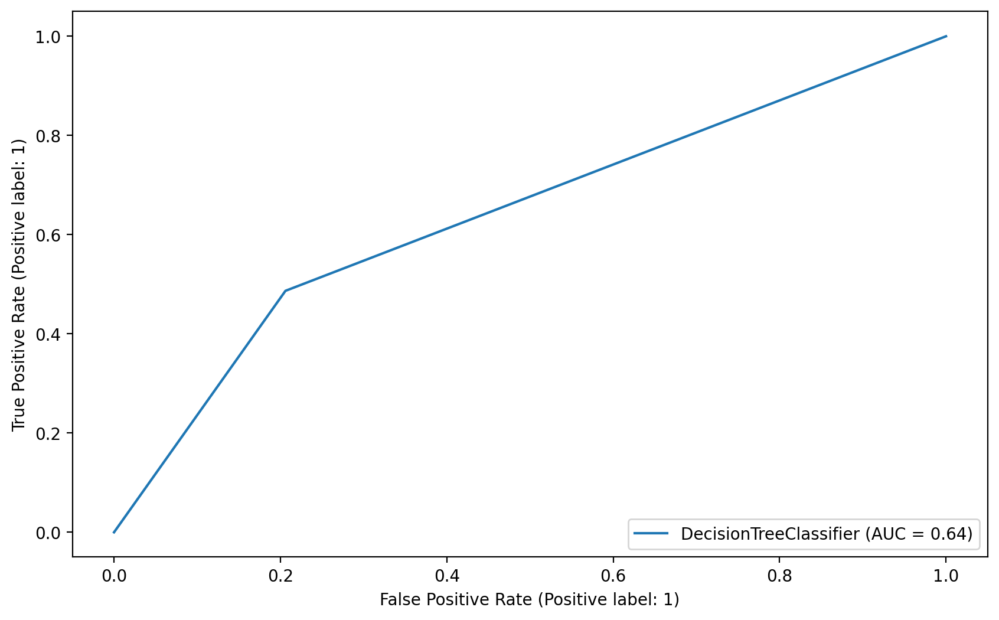

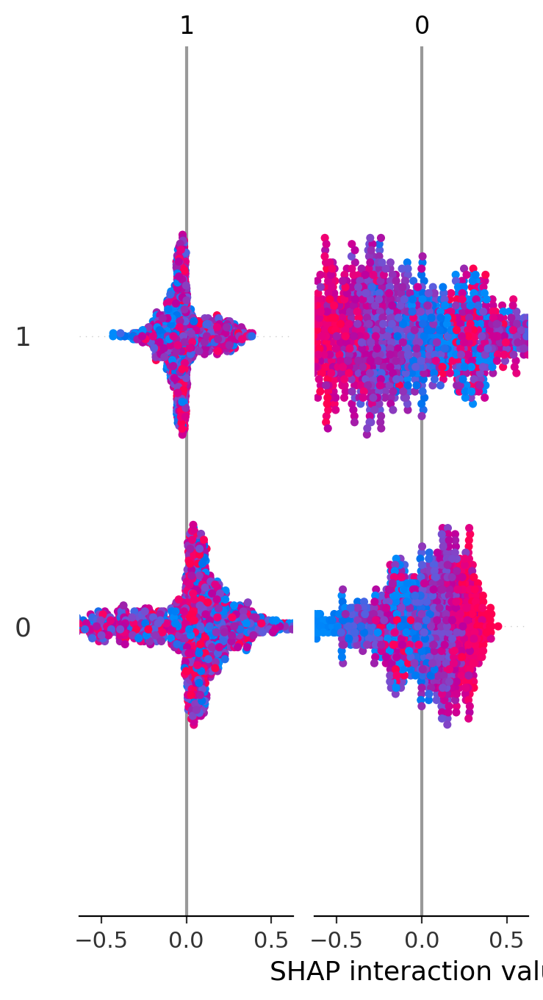

-------------------------------------------------- Gaussian Naive Bayes --------------------------------------------------
Model name: Gaussian Naive Bayes
accuracy_score: 0.735
roc_auc_score: 0.5008267314632429
precision_score: 0.3
f1_score: 0.018518518518518517


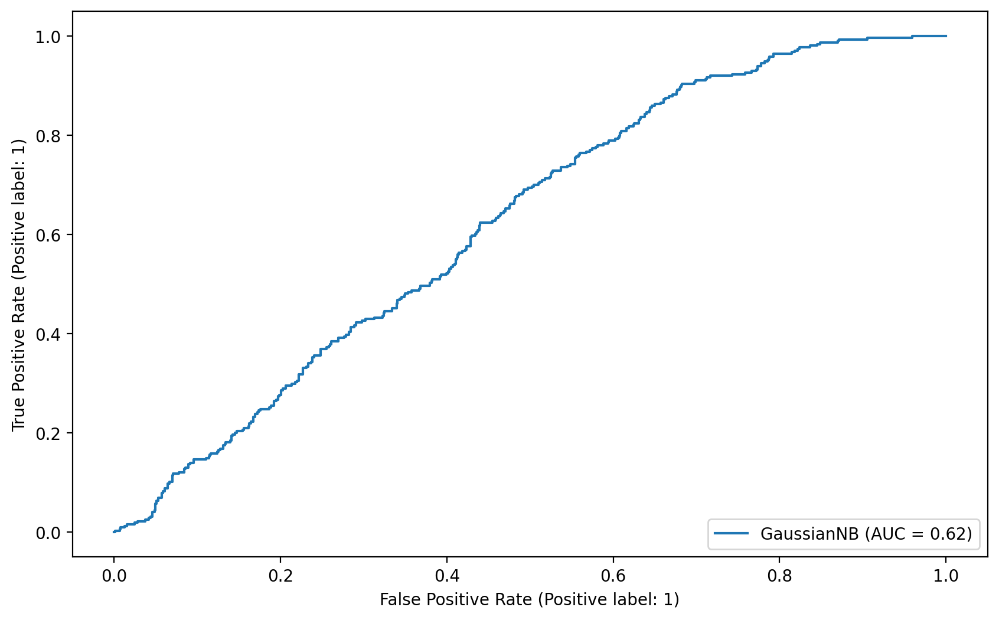

-------------------------------------------------- KNeighborsClassifier --------------------------------------------------
Model name: KNeighborsClassifier
accuracy_score: 0.7458333333333333
roc_auc_score: 0.6020114499501507
precision_score: 0.6133333333333333
f1_score: 0.3762781186094069


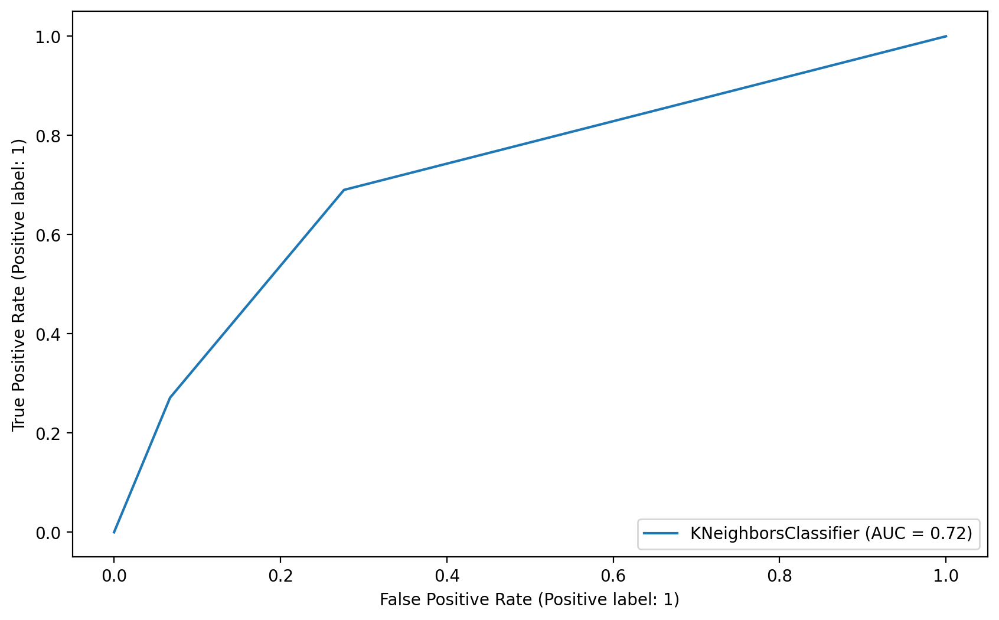

-------------------------------------------------- AdaBoostClassifier --------------------------------------------------
Model name: AdaBoostClassifier
accuracy_score: 0.7541666666666667
roc_auc_score: 0.5569503667686786
precision_score: 0.573170731707317
f1_score: 0.24164524421593833


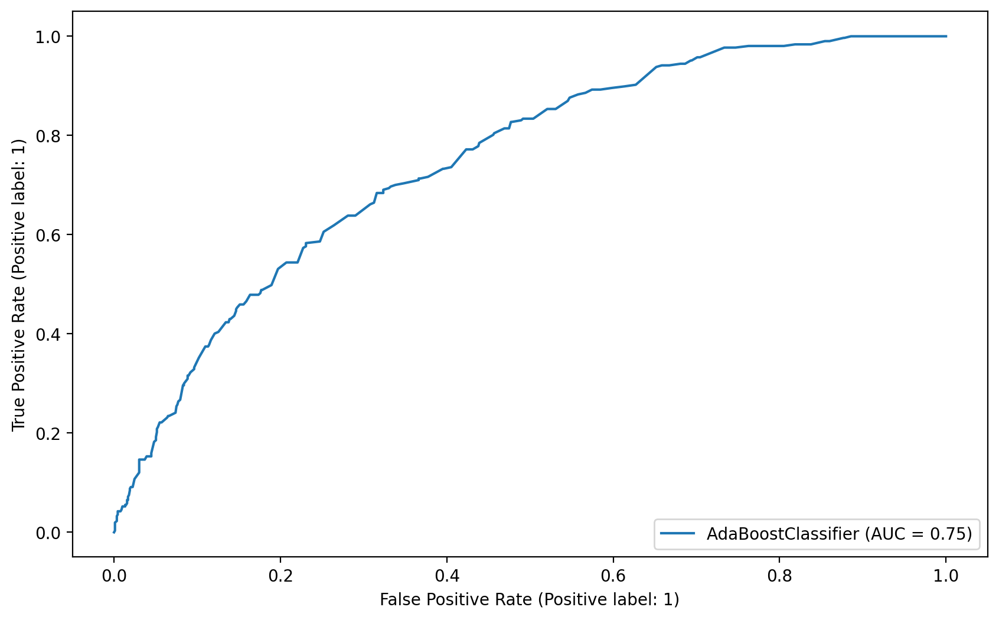

-------------------------------------------------- CatBoostClassifier --------------------------------------------------
Learning rate set to 0.020127
0:	learn: 0.6867001	total: 1.02ms	remaining: 1.02s
1:	learn: 0.6806738	total: 2.1ms	remaining: 1.05s
2:	learn: 0.6753333	total: 2.99ms	remaining: 995ms
3:	learn: 0.6696396	total: 3.9ms	remaining: 970ms
4:	learn: 0.6653190	total: 4.65ms	remaining: 925ms
5:	learn: 0.6600149	total: 5.49ms	remaining: 909ms
6:	learn: 0.6555250	total: 6.28ms	remaining: 891ms
7:	learn: 0.6505691	total: 7.09ms	remaining: 879ms
8:	learn: 0.6460420	total: 7.92ms	remaining: 872ms
9:	learn: 0.6419206	total: 8.74ms	remaining: 866ms
10:	learn: 0.6375611	total: 9.57ms	remaining: 861ms
11:	learn: 0.6331488	total: 10.4ms	remaining: 853ms
12:	learn: 0.6291943	total: 11.2ms	remaining: 847ms
13:	learn: 0.6259179	total: 12ms	remaining: 845ms
14:	learn: 0.6227342	total: 12.8ms	remaining: 839ms
15:	learn: 0.6196626	total: 13.6ms	remaining: 835ms
16:	learn: 0.6160289	total: 14.

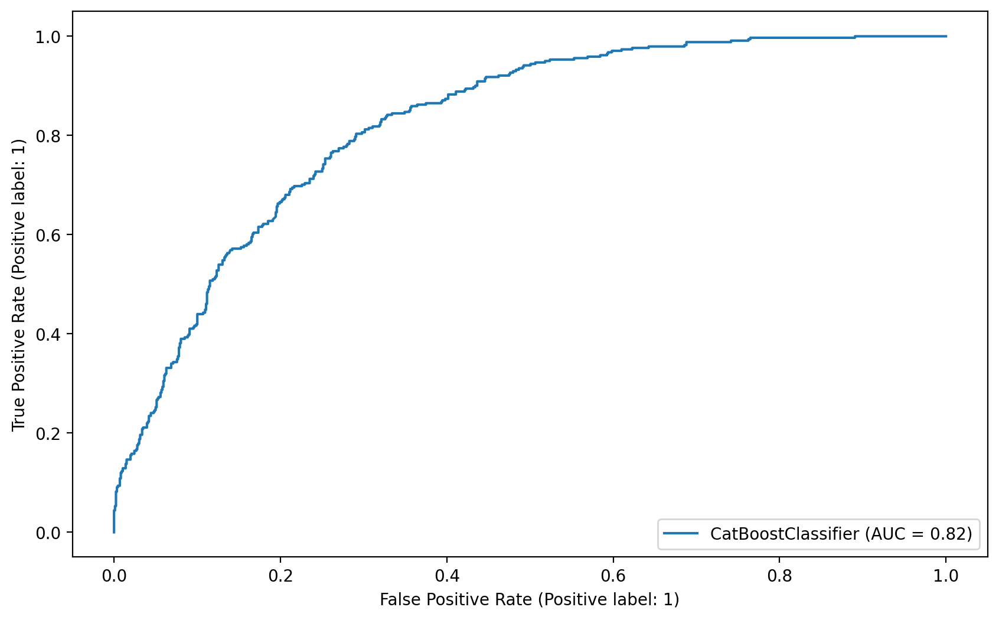

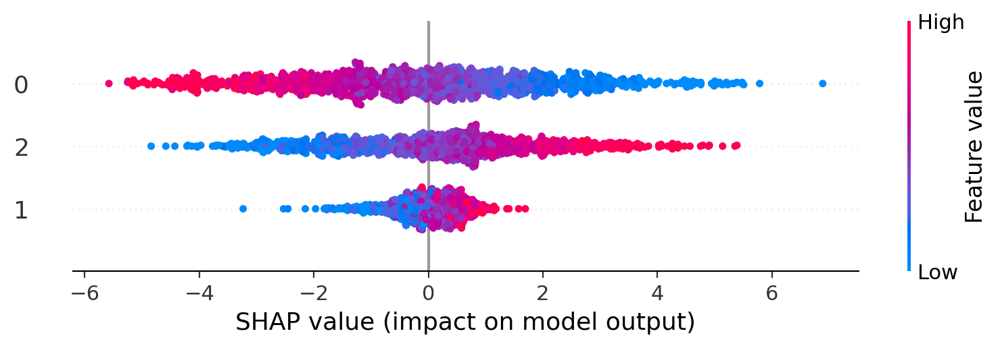

-------------------------------------------------- XGBClassifier --------------------------------------------------
Model name: XGBClassifier
accuracy_score: 0.7866666666666666
roc_auc_score: 0.706716280649132
precision_score: 0.6187050359712231
f1_score: 0.5733333333333334


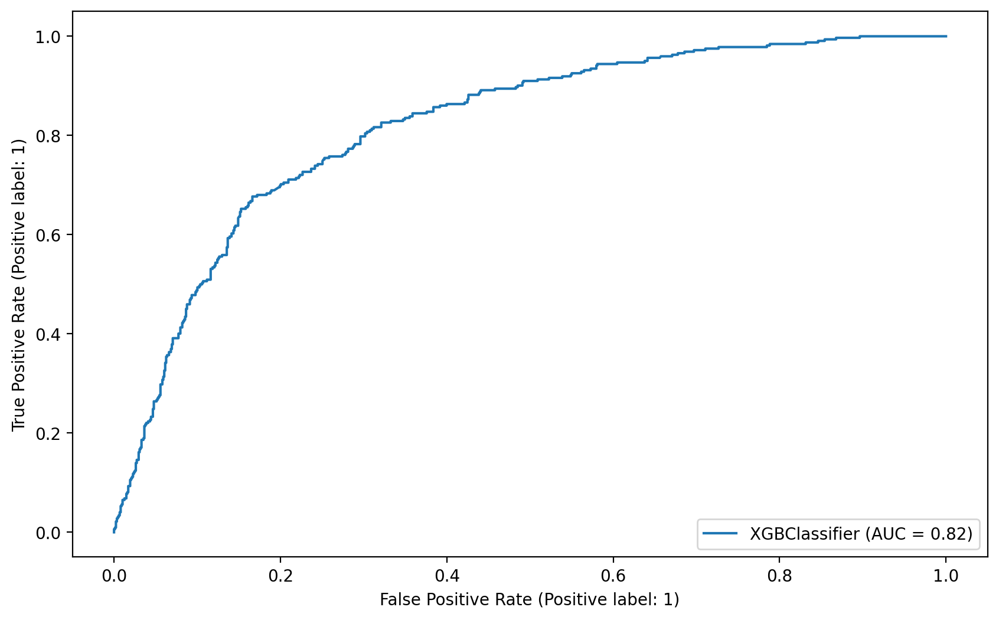

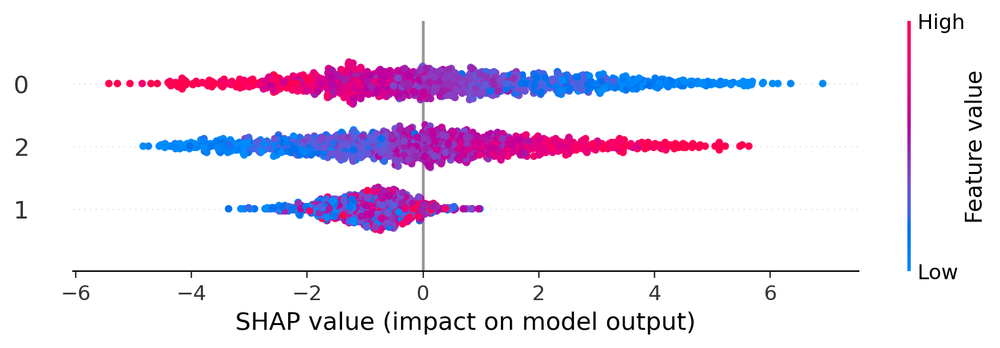

-------------------------------------------------- LGBMClassifier --------------------------------------------------
[LightGBM] [Info] Number of positive: 1316, number of negative: 3483
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 4799, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.274224 -> initscore=-0.973297
[LightGBM] [Info] Start training from score -0.973297
Model name: LGBMClassifier
accuracy_score: 0.7666666666666667
roc_auc_score: 0.6690384877110822
precision_score: 0.5983935742971888
f1_score: 0.5155709342560554


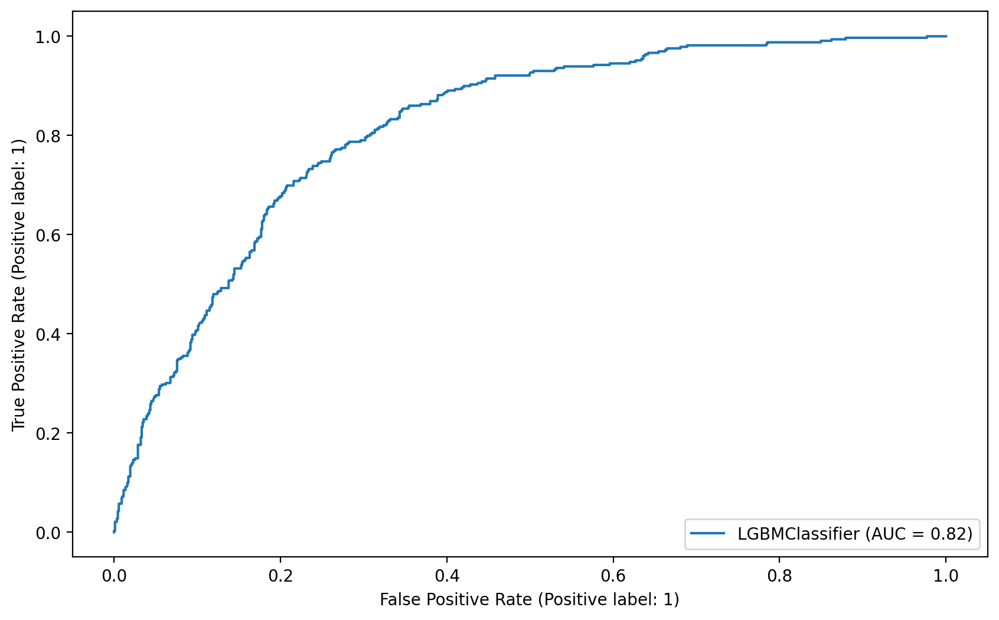

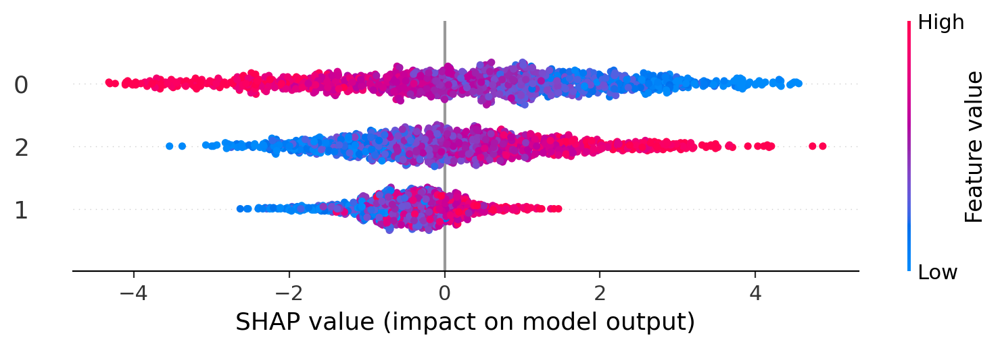

-------------------------------------------------- logistic regression --------------------------------------------------
Model name: logistic regression
accuracy_score: 0.7825
roc_auc_score: 0.6646577828458587
precision_score: 0.6785714285714286
f1_score: 0.5047438330170777


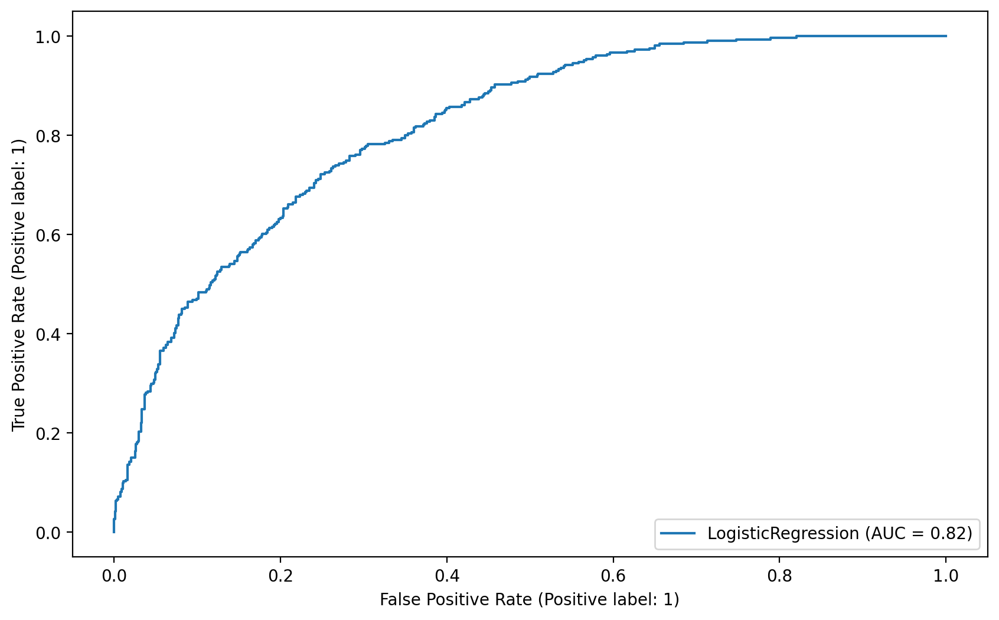

-------------------------------------------------- Support vector machine --------------------------------------------------
Model name: Support vector machine
accuracy_score: 0.7416666666666667
roc_auc_score: 0.5727763393142737
precision_score: 0.7468354430379747
f1_score: 0.2757009345794392


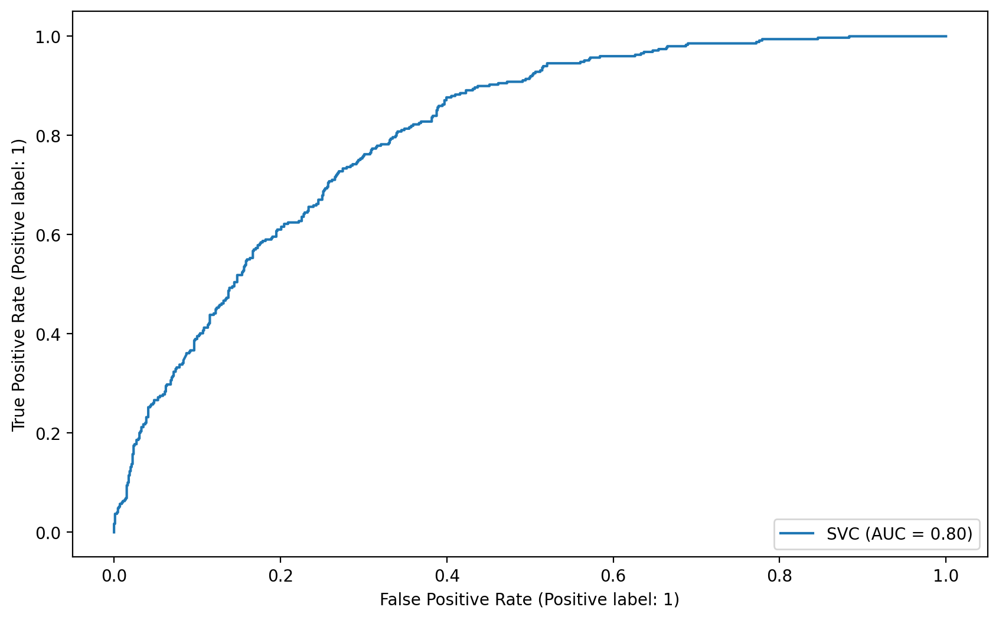

-------------------------------------------------- basic random forrest --------------------------------------------------
Model name: basic random forrest
accuracy_score: 0.7791666666666667
roc_auc_score: 0.6731418087112577
precision_score: 0.5882352941176471
f1_score: 0.5137614678899083


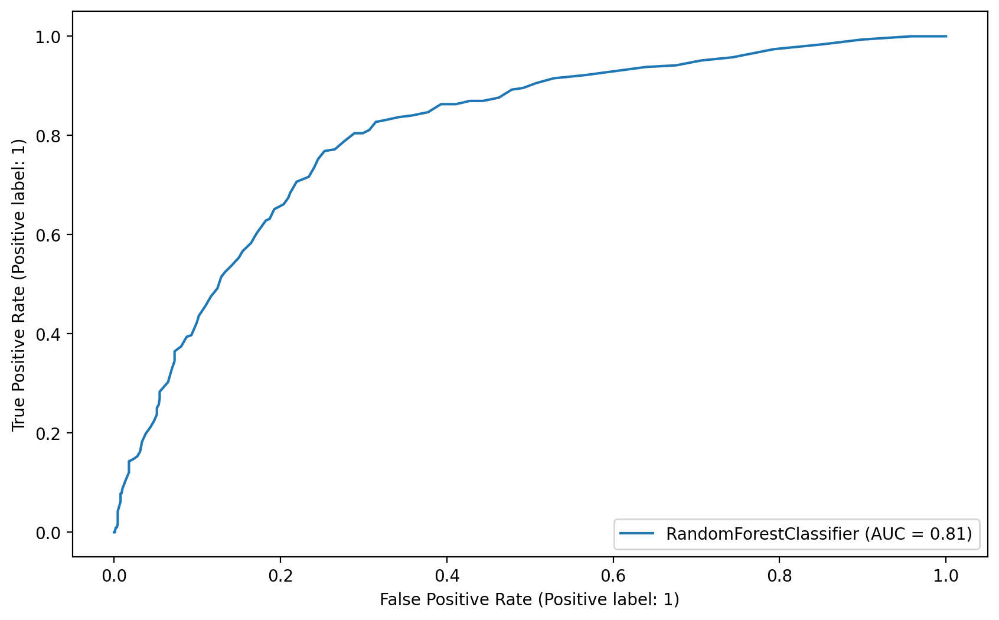

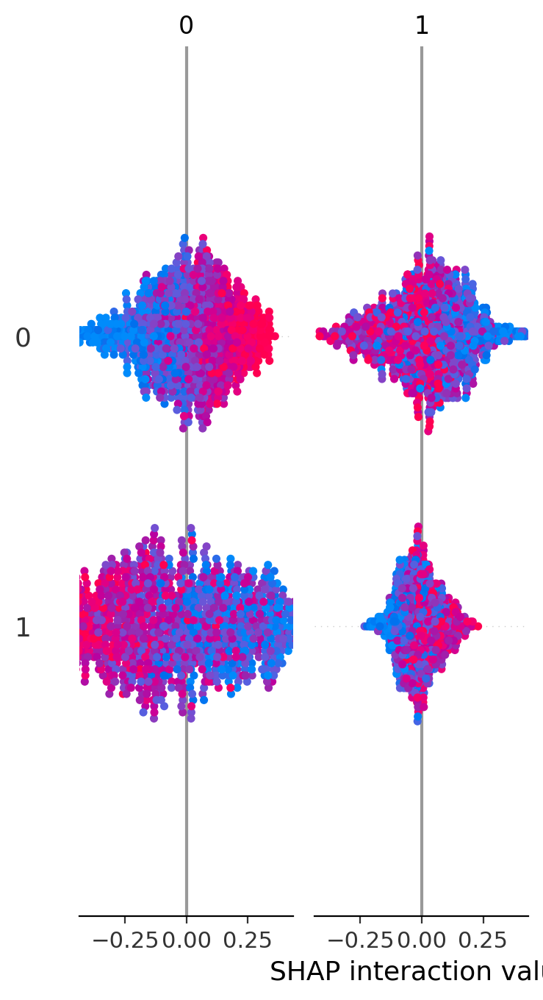

In [88]:
results=[]
for m in models:
    print("-"*50,m["name"],"-"*50)
    results.append(classify(df_interval.drop("3",axis=1),0.2,m["model"],m["name"]))

*compare results*

In [21]:
def compare_model_results(results):

    a, p, r, f,names = [], [], [], [],[]
    for res in results:
        a.append(res["accuracy"])
        p.append(res["precision"])
        r.append(res["recall"])
        f.append(res["f1"])
        names.append(res["name"])
    #
    model_score = pd.DataFrame([a,p,r,f],
                 columns = names).T.sort_values(by=3, ascending=False).rename(columns={0:'Accuracy', 1: 'Precision', 2: 'Recall', 3: 'F1',}).round(4) 
    print(model_score)


In [89]:


compare_model_results(results)

                        Accuracy  Precision  Recall      F1
XGBClassifier             0.7867     0.6187  0.5342  0.5733
LGBMClassifier            0.7667     0.5984  0.4529  0.5156
basic random forrest      0.7792     0.5882  0.4560  0.5138
logistic regression       0.7825     0.6786  0.4018  0.5047
decision tree             0.7067     0.4840  0.4868  0.4854
CatBoostClassifier        0.7658     0.6546  0.3724  0.4748
KNeighborsClassifier      0.7458     0.6133  0.2714  0.3763
Support vector machine    0.7417     0.7468  0.1691  0.2757
AdaBoostClassifier        0.7542     0.5732  0.1531  0.2416
Gaussian Naive Bayes      0.7350     0.3000  0.0096  0.0185


### 2.2 using unrealted features
In this section we will try to create classification based on differnt (not ELO) features

In [53]:
player_df=pd.read_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-blitz-rated-vfinal-players.csv")
player_df

,Unnamed: 0,Result,FICSGamesDBGameNo,Player,Elo,Opponent,OpponentElo,Date,Time,Year,Month,Day,Hour,Minute,Second
0,0,Won,455505130,Strikko,1606,boggus,1607,2019.11.30,08:05:00,2019,11,30,8,5,0
1,1,Won,455505129,Wychbold,1311,Jarlaxle,1437,2019.11.30,08:07:00,2019,11,30,8,7,0
2,2,Lost,455505128,Shaderman,1567,tihibuda,1516,2019.11.30,08:06:00,2019,11,30,8,6,0
3,3,Lost,455505126,aussenschnapp,1680,SchachDieter,1698,2019.11.30,08:05:00,2019,11,30,8,5,0
4,4,Won,455505123,pfink,1288,Tojul,1174,2019.11.30,07:56:00,2019,11,30,7,56,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27723453,14408055,Won,434845469,bretteux,1155,Arembepe,1059,2018.08.09,12:16:00,2018,8,9,12,16,0
27723454,14408056,Won,434845468,HWPer,1520,JonotheRed,1501,2018.08.09,12:12:00,2018,8,9,12,12,0
27723455,14408057,Lost,434845467,Jonfern,1676,snackking,1621,2018.08.09,12:13:00,2018,8,9,12,13,0
27723456,14408058,Lost,434845465,Jesuslovesall,1423,alza,1333,2018.08.09,12:14:00,2018,8,9,12,14,0


In [54]:
df_2018=player_df[player_df["Year"]==2018]
del player_df
df_2018

,Unnamed: 0,Result,FICSGamesDBGameNo,Player,Elo,Opponent,OpponentElo,Date,Time,Year,Month,Day,Hour,Minute,Second
8913,9602,Lost,455492835,rizaisfa,1540,Eldongo,1558,2018.08.31,07:58:00,2018,8,31,7,58,0
9630,10382,Tie,450877124,pietroa,828,weaker,973,2018.08.19,13:51:00,2018,8,19,13,51,0
15567,16660,Won,450869119,Calx,1621,DixierRebel,1514,2018.11.25,16:53:00,2018,11,25,16,53,0
17740,18981,Lost,450866229,DixierRebel,1504,henkdedenktenk,1487,2018.11.20,07:52:00,2018,11,20,7,52,0
17756,18997,Won,450866210,DixierRebel,1542,WASFOX,1542,2018.11.10,15:59:00,2018,11,10,15,59,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27723453,14408055,Won,434845469,bretteux,1155,Arembepe,1059,2018.08.09,12:16:00,2018,8,9,12,16,0
27723454,14408056,Won,434845468,HWPer,1520,JonotheRed,1501,2018.08.09,12:12:00,2018,8,9,12,12,0
27723455,14408057,Lost,434845467,Jonfern,1676,snackking,1621,2018.08.09,12:13:00,2018,8,9,12,13,0
27723456,14408058,Lost,434845465,Jesuslovesall,1423,alza,1333,2018.08.09,12:14:00,2018,8,9,12,14,0


In [20]:
def get_samples(df,max_date):
    groups={g:data for g,data in df.groupby("Player")}

    samples={"Player":list(groups.keys())}
    num_samples=0
    for k,v in groups.items():
        num_samples=max(num_samples,len(v[pd.to_datetime(v["Date"])<max_date]))
    
    for k,v in groups.items():
        r=list(v.sort_values(by="FICSGamesDBGameNo")["Elo"])
        for i in range(num_samples):
            try:
                samples[i]=samples.get(i,[])
                samples[i].append(r[i])
            except Exception as err:    
                samples[i].append(-1)
    return pd.DataFrame.from_dict(samples)


In [14]:
from  tsfresh.feature_extraction.feature_calculators import kurtosis
from scipy.stats import skew
from tsfresh.feature_extraction.feature_calculators import mean_abs_change
from scipy.stats import shapiro

def get_feature_df(df):
    return pd.DataFrame.from_dict({
        "Player":[list(df["Player"])[0]],
        "mean":np.mean(list(df["Elo"])),
        "var":np.var(list(df["Elo"])),
        "kurtosis":skew(list(df["Elo"])),
        "skew":skew(list(df["Elo"])),
        "min":min(list(df["Elo"])),
        "max":max(list(df["Elo"])),
    })


In [22]:
def get_extra_feature_df(df):
    return df


In [23]:
df_2018

,Unnamed: 0,Result,FICSGamesDBGameNo,Player,Elo,Opponent,OpponentElo,Date,Time,Year,Month,Day,Hour,Minute,Second
8913,9602,Lost,455492835,rizaisfa,1540,Eldongo,1558,2018.08.31,07:58:00,2018,8,31,7,58,0
9630,10382,Tie,450877124,pietroa,828,weaker,973,2018.08.19,13:51:00,2018,8,19,13,51,0
15567,16660,Won,450869119,Calx,1621,DixierRebel,1514,2018.11.25,16:53:00,2018,11,25,16,53,0
17740,18981,Lost,450866229,DixierRebel,1504,henkdedenktenk,1487,2018.11.20,07:52:00,2018,11,20,7,52,0
17756,18997,Won,450866210,DixierRebel,1542,WASFOX,1542,2018.11.10,15:59:00,2018,11,10,15,59,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27723453,14408055,Won,434845469,bretteux,1155,Arembepe,1059,2018.08.09,12:16:00,2018,8,9,12,16,0
27723454,14408056,Won,434845468,HWPer,1520,JonotheRed,1501,2018.08.09,12:12:00,2018,8,9,12,12,0
27723455,14408057,Lost,434845467,Jonfern,1676,snackking,1621,2018.08.09,12:13:00,2018,8,9,12,13,0
27723456,14408058,Lost,434845465,Jesuslovesall,1423,alza,1333,2018.08.09,12:14:00,2018,8,9,12,14,0


In [50]:

def get_features_per_player(players,max_date,df,extra_df):
    df_f=df[pd.to_datetime(df["Date"])<max_date]
    df_f=df_f[df_f["Player"].isin(players)]
    groups=df_f.groupby("Player")
    groups_d={p:groups.get_group(p) for p in players}
    frames=[]
    for p in players:
        frames.append(get_feature_df(groups_d.get(p)))
    
    return pd.concat(frames)


In [25]:

def get_game_ids(players,max_date,df):
    df_f=df[pd.to_datetime(df["Date"])<max_date]
    df_f=df_f[df_f["Player"].isin(players)]
    groups=df_f.groupby("Player")
    groups_d={p:groups.get_group(p) for p in players}
    ids=[]
    for p in players:
        for game_id in list((groups_d.get(p)["FICSGamesDBGameNo"])):
            ids.append(game_id)
    
    return ids


In [26]:
players=df_interval.index

game_ids=get_game_ids(players,pd.to_datetime([f'{2018}-09-01 00:00:00']).min(),df_2018)
with open(f"{PROJECT_PATH}/data/fics/proccessed/players.pkl", 'wb') as f:
    pickle.dump(players, f)
with open(f"{PROJECT_PATH}/data/fics/proccessed/game_ids.pkl", 'wb') as f:
    pickle.dump(game_ids, f)

In [8]:
with open(f"{PROJECT_PATH}/data/fics/proccessed/game_ids.pkl", 'rb') as f:
    game_ids=pickle.load( f)

In [9]:
with open(f"{PROJECT_PATH}/data/fics/proccessed/players.pkl", 'rb') as f:
    players=pickle.load( f)

In [10]:
extra_df=pd.read_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-blitz-rated-vfinal-details.csv")
extra_df=extra_df[extra_df["FICSGamesDBGameNo"].isin(game_ids)]
extra_df=extra_df=extra_df[(extra_df["White"].isin(players))|extra_df["Black"].isin(players)]
extra_df=extra_df.drop(columns=["Unnamed: 0.1","Unnamed: 0"])

In [11]:
extra_df

,FICSGamesDBGameNo,White,Black,WhiteElo,BlackElo,WhiteRD,BlackRD,TimeControl,Date,Time,...,BlackClock,ECO,PlyCount,Result,Move,Year,EloDiff,RelativeEloDiff,ECO_class,Winning status
9586,455492835,rizaisfa,Eldongo,1540,1558,17.7,24.3,300+0,2018.08.31,07:58:00,...,0:05:00.000,A00,23,1-0,| e3 e5 | d3 d5 | a3 c5 | b3 f5 | h3 Nc6 | g4 ...,2018,-18,-0.58,A,resign
10366,450877124,pietroa,weaker,828,973,95.8,39.2,120+12,2018.08.19,13:51:00,...,0:02:00.000,B01,37,1/2-1/2,| e4 d5 | e5 d4 | d3 Nc6 | Nf3 Bg4 | h3 Bh5 | ...,2018,-145,-8.05,B,draw
20125,450976197,sirpicha,windbumwino,1563,1462,28.9,25.5,180+0,2018.06.10,10:04:00,...,0:03:00.000,B06,127,1-0,| e4 g6 | f4 Bg7 | d4 d6 | Nf3 Nc6 | c3 e5 | f...,2018,101,3.34,B,forfeit
21244,450974811,shatirhassan,criololoco,1461,1279,23.9,43.6,180+12,2018.06.01,08:23:00,...,0:03:00.000,B21,121,1/2-1/2,| e4 c5 | d4 cxd4 | Qxd4 Nc6 | Qd1 e5 | Bc4 Nf...,2018,182,6.64,B,draw
22405,450973335,thohai,kristianmach,1721,1740,28.3,25.3,180+0,2018.07.02,12:09:00,...,0:03:00.000,A40,23,1-0,| d4 e6 | Nf3 b6 | e3 Bb7 | Bd3 c5 | O-O d5 | ...,2018,-19,-0.55,A,resign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14322471,434845469,Arembepe,bretteux,1059,1155,46.6,28.1,180+1,2018.08.09,12:16:00,...,0:03:00.000,B20,47,1-0,| e4 c5 | Bc4 a6 | a3 Nc6 | d3 h6 | h3 Nf6 | N...,2018,-96,-4.34,B,resign
14322472,434845468,JonotheRed,HWPer,1501,1520,27.1,33.7,300+0,2018.08.09,12:12:00,...,0:05:00.000,C01,109,1-0,| e4 e6 | Nf3 d5 | exd5 exd5 | d4 Nf6 | Bd3 Bd...,2018,-19,-0.63,C,resign
14322473,434845467,snackking,Jonfern,1621,1676,18.9,26.6,180+0,2018.08.09,12:13:00,...,0:03:00.000,C50,80,0-1,| e4 e5 | Nf3 Nc6 | Bc4 Be7 | O-O Nf6 | Re1 O-...,2018,-55,-1.67,C,forfeit
14322474,434845465,alza,Jesuslovesall,1333,1423,19.9,21.0,300+0,2018.08.09,12:14:00,...,0:05:00.000,B01,42,0-1,| e4 d5 | e5 c5 | d4 Nc6 | dxc5 Nxe5 | Nf3 Nc6...,2018,-90,-3.27,B,resign


In [15]:
def get_extra_details_features(players,extra_df):
    features={
        "Player":[],
        "ECO_A":[],
        "ECO_B":[],
        "ECO_C":[],
        "ECO_D":[],
        "ECO_E":[],
        "PlyCountMean":[],
        "PlyCountVar":[],
        "PlyCountSkew":[],
        "TotalGames":[],
    }
    for p in tqdm(players):
        try:
            curr_w=extra_df.groupby("White").get_group(p)
        except Exception as err:
            curr_w=None

        try:
            curr_b=extra_df.groupby("Black").get_group(p)
        except Exception as err:
            curr_b=None

        if curr_w is None and curr_b is not None:
            curr=curr_b
        elif curr_b is None and curr_w is not None:
            curr=curr_w
        else:    
            curr=pd.concat([curr_w,curr_b])
            
        eco=dict(Counter(list(curr["ECO"].apply(lambda m:m[0]))))
        total_eco=sum(eco.values())
        for k in ["A","B","C","D","E"]:
            features[f"ECO_{k}"].append(100*(eco.get(k,0)/total_eco))

        features["Player"].append(p)
        features["PlyCountMean"].append(np.mean(curr["PlyCount"]))
        features["PlyCountVar"].append(np.var(curr["PlyCount"]))
        features["PlyCountSkew"].append(skew(curr["PlyCount"]))
        features["TotalGames"].append(len(curr))
        
    df= pd.DataFrame.from_dict(features)
    df.index=list(df["Player"])
    df=df.drop(columns=["Player"])
    return df

parsed_details=get_extra_details_features(players,extra_df)

100%|██████████| 5999/5999 [53:15<00:00,  1.88it/s] 


,ECO_A,ECO_B,ECO_C,ECO_D,ECO_E,PlyCountMean,PlyCountVar,PlyCountSkew,PlyCountKurtosis,TotalGames
ABCi,20.000000,26.666667,0.000000,26.666667,26.666667,67.533333,683.048889,0.758514,1.317539,15
ABSBEGINNER,5.826558,23.983740,56.436314,13.346883,0.406504,79.505420,984.621244,0.525922,0.321304,1476
ADJUSTOR,18.660907,35.485961,36.090713,0.215983,9.546436,75.049676,518.122802,0.190994,0.197887,4630
AFCERGY,26.934436,30.379996,0.472534,30.399685,11.813349,85.253790,882.118894,-0.074684,-0.345415,5079
AFRF,20.840000,55.560000,23.080000,0.440000,0.080000,65.696400,870.892227,1.512712,10.789520,2500
...,...,...,...,...,...,...,...,...,...,...
zwartspeler,29.130088,29.449322,1.436552,20.430966,19.553073,81.717478,888.628880,0.479423,0.328502,1253
zwirek,42.857143,14.285714,14.285714,28.571429,0.000000,74.428571,1457.959184,0.729793,0.226893,7
zxtxf,58.064516,25.806452,6.451613,6.451613,3.225806,69.483871,743.798127,0.253001,0.556348,31
zyrq,20.907618,36.628849,11.669368,30.470016,0.324149,63.868720,806.648892,0.699075,0.483660,617


In [ ]:
parsed_details["Label"]=df_interval["Label"]

*run models*

-------------------------------------------------- decision tree --------------------------------------------------
Model name: decision tree
accuracy_score: 0.6083333333333333
roc_auc_score: 0.5095507129405434
precision_score: 0.2753623188405797
f1_score: 0.2878787878787879


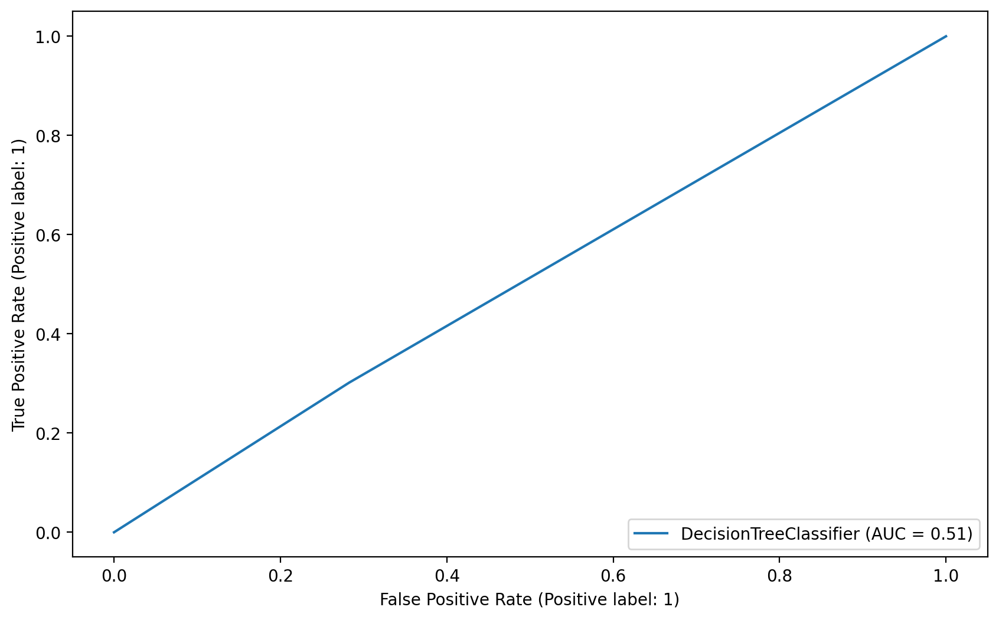

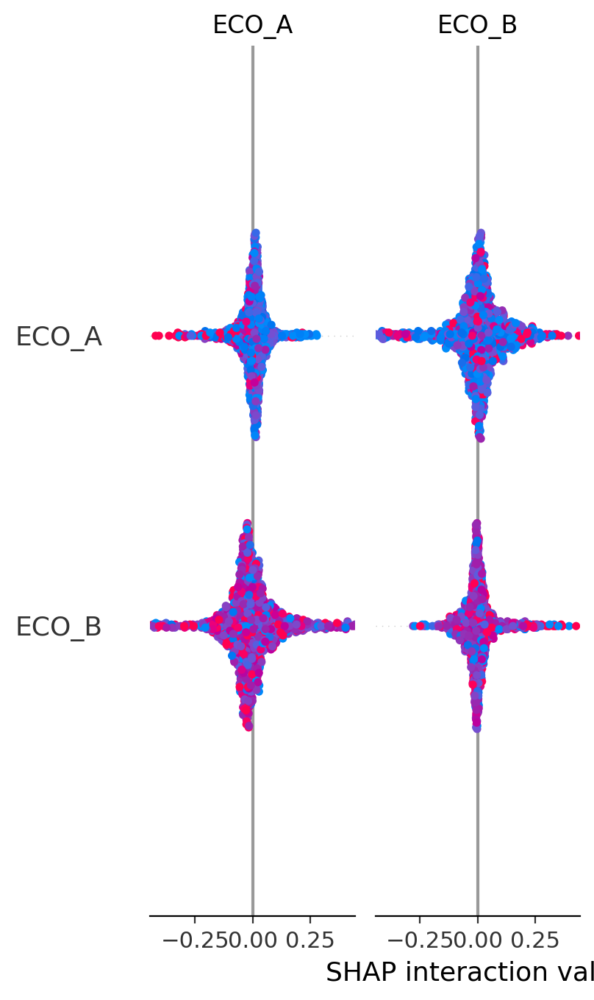

-------------------------------------------------- Gaussian Naive Bayes --------------------------------------------------
Model name: Gaussian Naive Bayes
accuracy_score: 0.7191666666666666
roc_auc_score: 0.49268227064837233
precision_score: 0.15625
f1_score: 0.02881844380403458


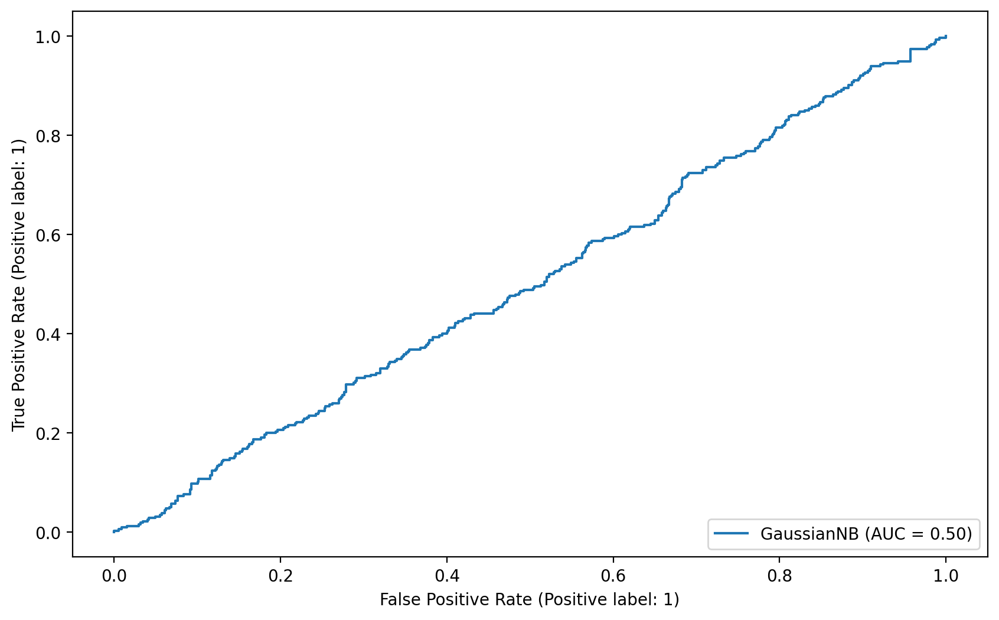

-------------------------------------------------- KNeighborsClassifier --------------------------------------------------
Model name: KNeighborsClassifier
accuracy_score: 0.6966666666666667
roc_auc_score: 0.5057464882571763
precision_score: 0.30952380952380953
f1_score: 0.12500000000000003


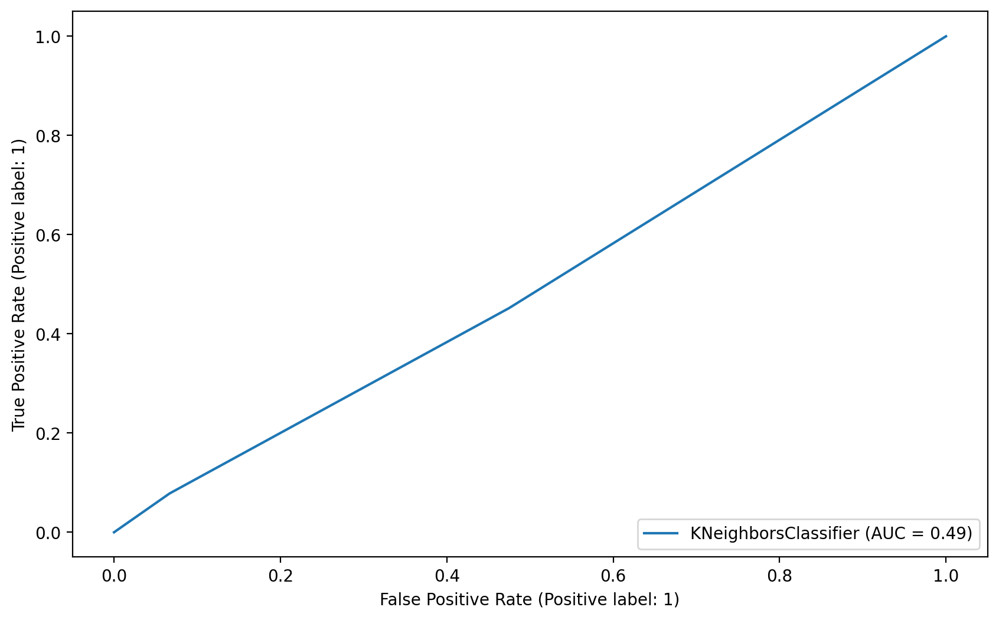

-------------------------------------------------- AdaBoostClassifier --------------------------------------------------
Model name: AdaBoostClassifier
accuracy_score: 0.7391666666666666
roc_auc_score: 0.4955186154066911
precision_score: 0.08333333333333333
f1_score: 0.006349206349206349


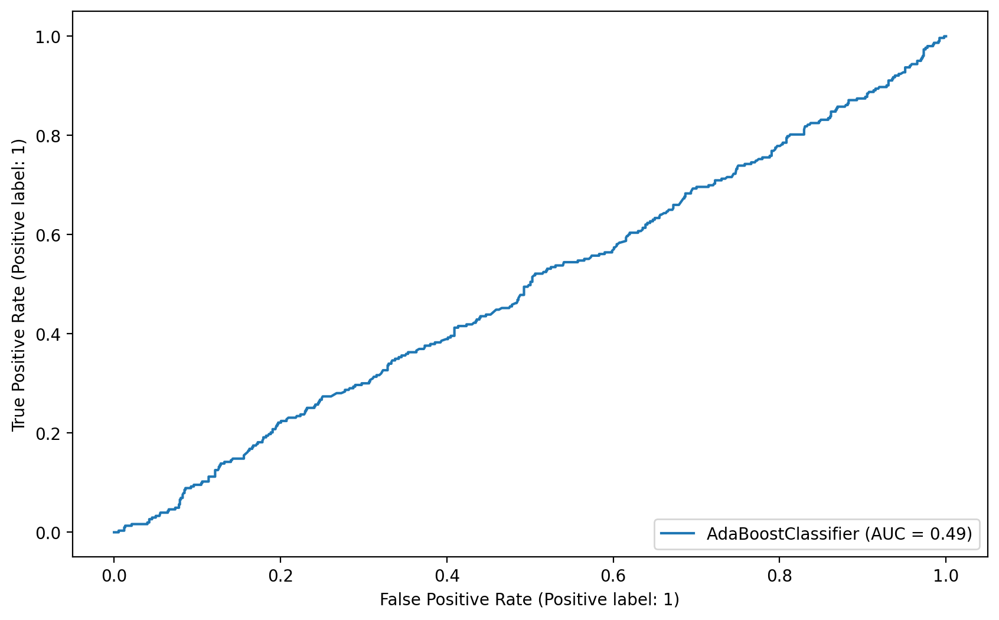

-------------------------------------------------- CatBoostClassifier --------------------------------------------------
Learning rate set to 0.020127
0:	learn: 0.6886766	total: 1.13ms	remaining: 1.13s
1:	learn: 0.6844239	total: 2.05ms	remaining: 1.02s
2:	learn: 0.6801736	total: 2.97ms	remaining: 986ms
3:	learn: 0.6761713	total: 3.85ms	remaining: 959ms
4:	learn: 0.6723724	total: 4.69ms	remaining: 934ms
5:	learn: 0.6688648	total: 5.54ms	remaining: 918ms
6:	learn: 0.6655043	total: 6.47ms	remaining: 919ms
7:	learn: 0.6622142	total: 7.34ms	remaining: 910ms
8:	learn: 0.6589810	total: 8.22ms	remaining: 905ms
9:	learn: 0.6559040	total: 9.08ms	remaining: 899ms
10:	learn: 0.6528162	total: 9.92ms	remaining: 892ms
11:	learn: 0.6499933	total: 10.8ms	remaining: 887ms
12:	learn: 0.6472628	total: 11.7ms	remaining: 889ms
13:	learn: 0.6445435	total: 12.6ms	remaining: 886ms
14:	learn: 0.6421242	total: 13.4ms	remaining: 882ms
15:	learn: 0.6398115	total: 14.3ms	remaining: 877ms
16:	learn: 0.6374818	total:

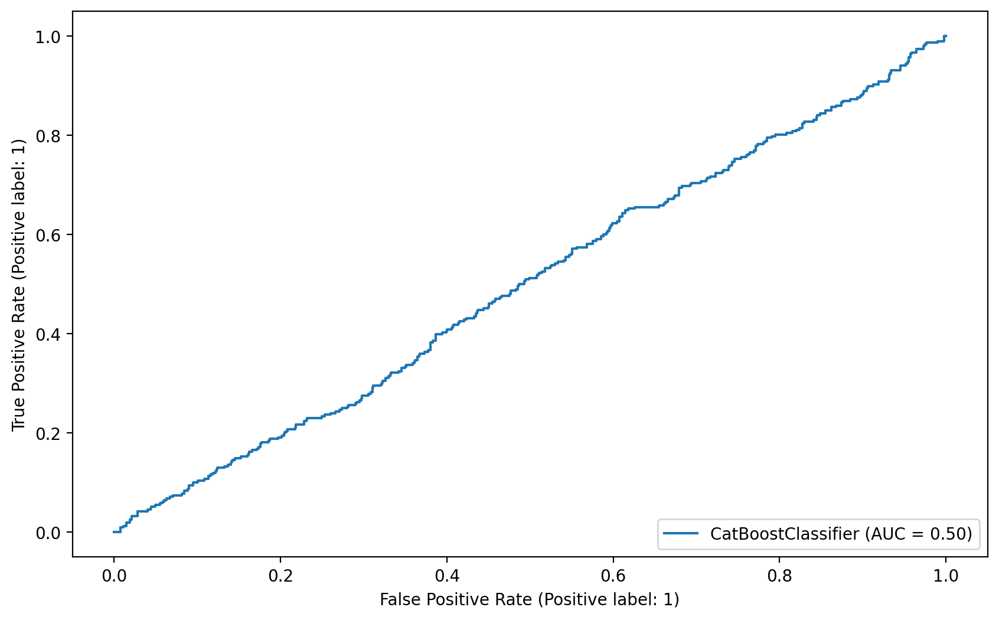

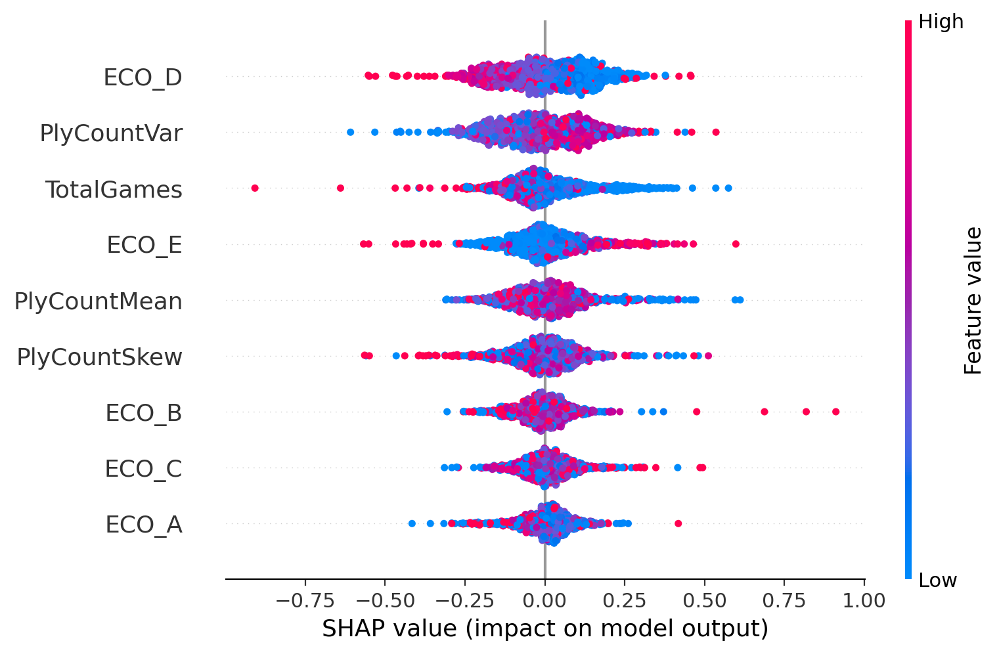

-------------------------------------------------- XGBClassifier --------------------------------------------------
Model name: XGBClassifier
accuracy_score: 0.6641666666666667
roc_auc_score: 0.4871995820271683
precision_score: 0.22962962962962963
f1_score: 0.13333333333333333


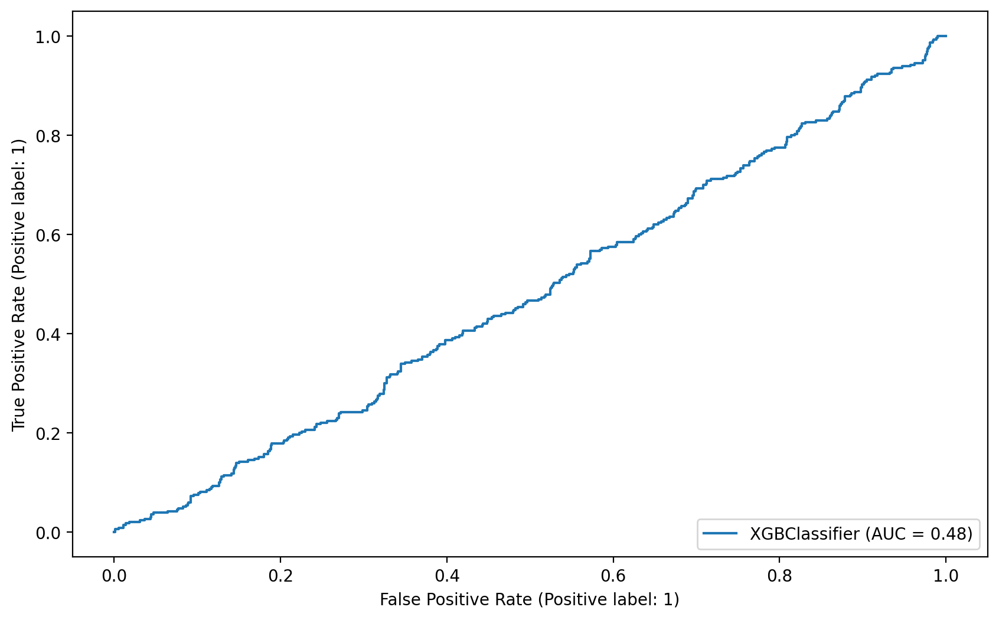

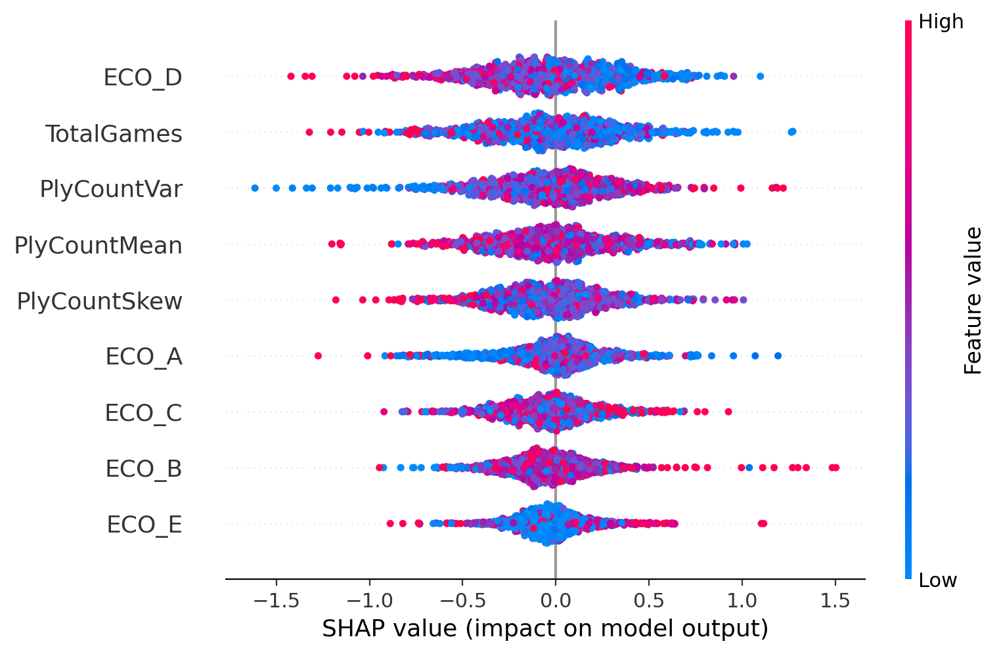

-------------------------------------------------- LGBMClassifier --------------------------------------------------
[LightGBM] [Info] Number of positive: 1331, number of negative: 3468
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 4799, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.277349 -> initscore=-0.957648
[LightGBM] [Info] Start training from score -0.957648
Model name: LGBMClassifier
accuracy_score: 0.7308333333333333
roc_auc_score: 0.5134254000661385
precision_score: 0.4
f1_score: 0.10027855153203344


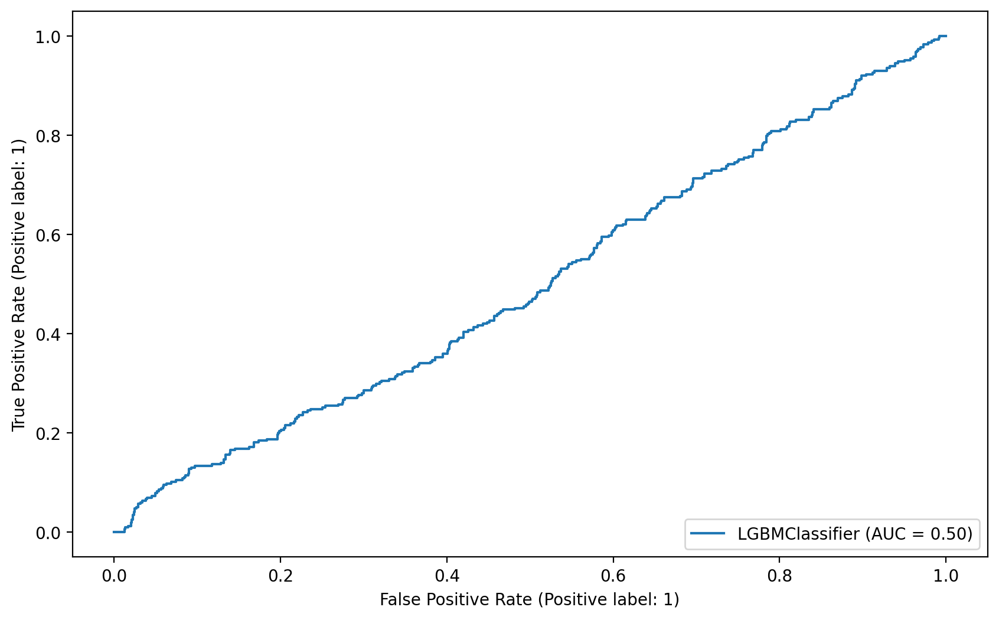

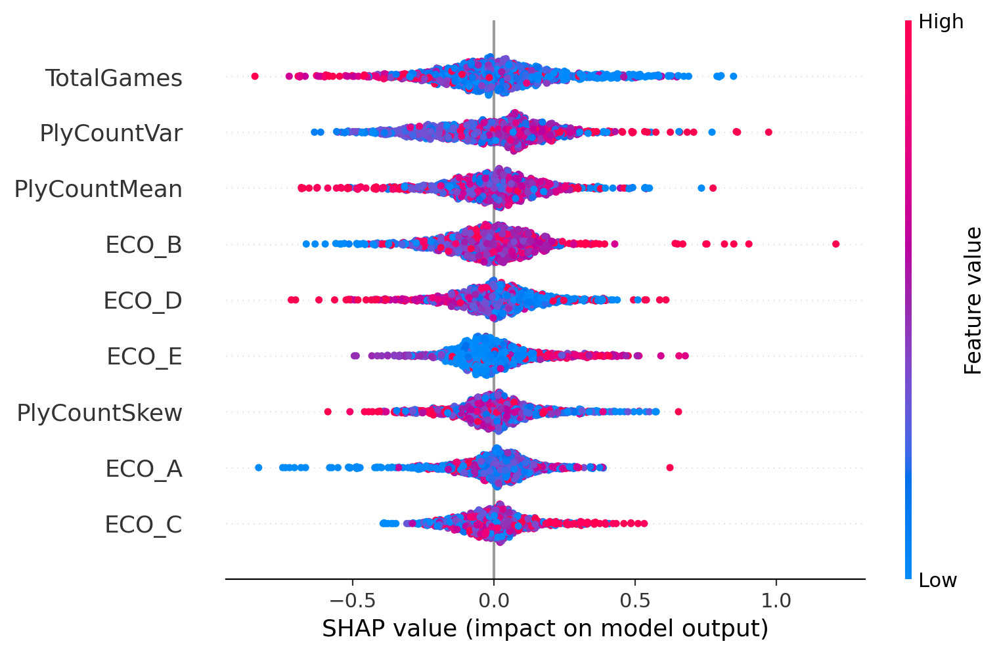

-------------------------------------------------- logistic regression --------------------------------------------------
Model name: logistic regression
accuracy_score: 0.7158333333333333
roc_auc_score: 0.5
precision_score: 0.0
f1_score: 0.0


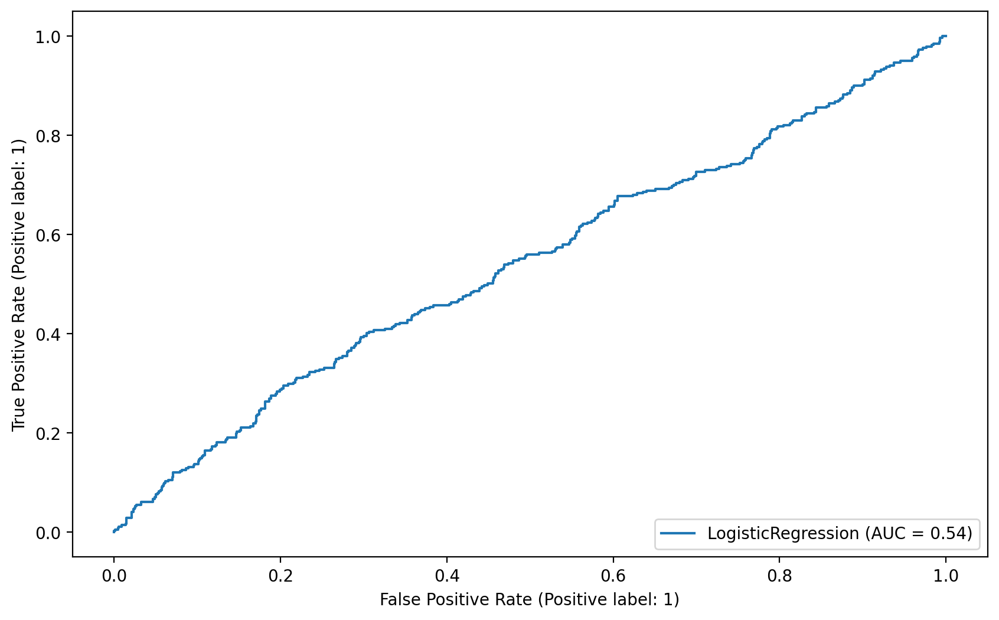

-------------------------------------------------- Support vector machine --------------------------------------------------
Model name: Support vector machine
accuracy_score: 0.755
roc_auc_score: 0.5
precision_score: 0.0
f1_score: 0.0


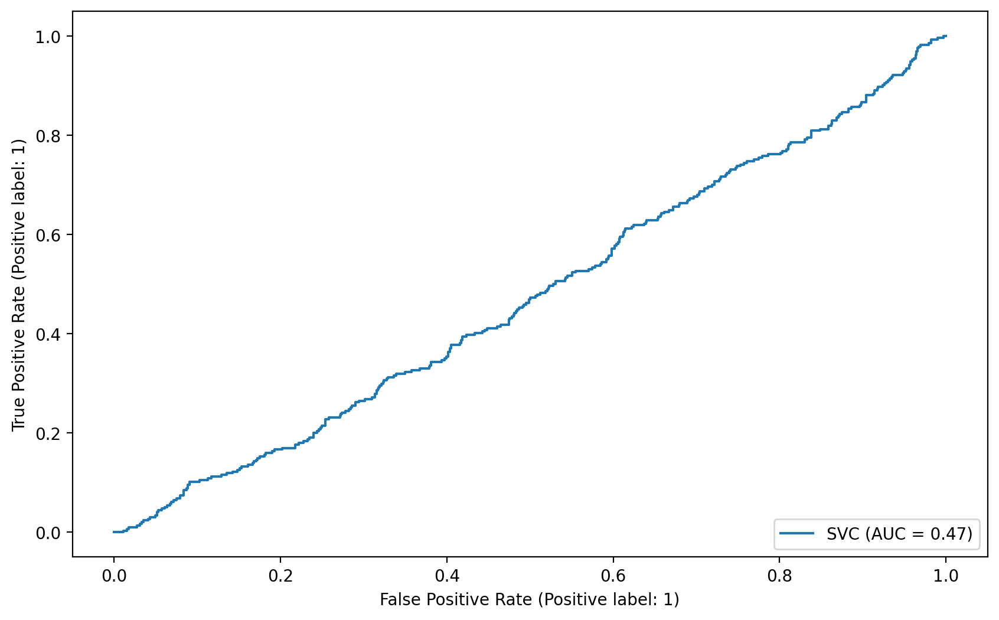

-------------------------------------------------- basic random forrest --------------------------------------------------
Model name: basic random forrest
accuracy_score: 0.7141666666666666
roc_auc_score: 0.5072642567509275
precision_score: 0.38235294117647056
f1_score: 0.07046070460704607


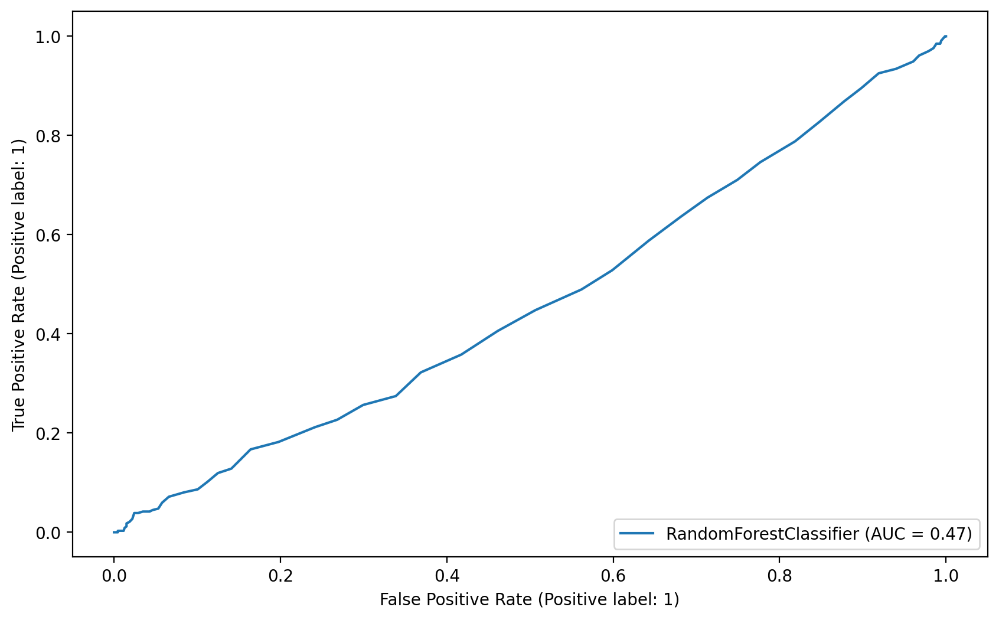

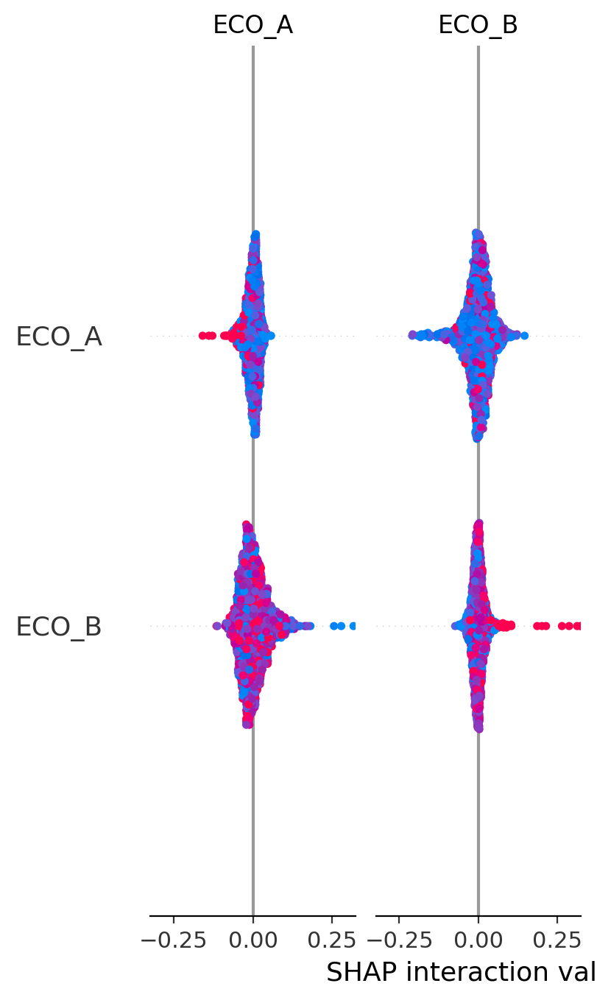

In [91]:
results=[]
for m in models:
    print("-"*50,m["name"],"-"*50)
    results.append(classify(parsed_details,0.2,m["model"],m["name"]))

*compare results*

In [92]:
compare_model_results(results)


                        Accuracy  Precision  Recall      F1
decision tree             0.6083     0.2754  0.3016  0.2879
XGBClassifier             0.6642     0.2296  0.0939  0.1333
KNeighborsClassifier      0.6967     0.3095  0.0783  0.1250
LGBMClassifier            0.7308     0.4000  0.0573  0.1003
basic random forrest      0.7142     0.3824  0.0388  0.0705
CatBoostClassifier        0.7350     0.2917  0.0227  0.0422
Gaussian Naive Bayes      0.7192     0.1562  0.0159  0.0288
AdaBoostClassifier        0.7392     0.0833  0.0033  0.0063
logistic regression       0.7158     0.0000  0.0000  0.0000
Support vector machine    0.7550     0.0000  0.0000  0.0000


In [48]:
with open(f"{PROJECT_PATH}/data/fics/proccessed/parsed_details.pkl", 'wb') as f:
    pickle.dump(parsed_details, f)

### 2.3 using game trends features

In this section we will try to predict game results using trend related features

In [55]:
players=df_interval.index

df=get_features_per_player(players,pd.to_datetime([f'{2018}-09-01 00:00:00']).min(),df_2018,extra_df)
df.index=list(df["Player"])
df=df.drop(columns="Player")
df["Label"]=choose_positive(label_trend(df_interval["Label"]))
df

,mean,var,kurtosis,skew,min,max,Label
ABCi,1463.333333,739.022222,-0.428960,-0.428960,1406,1502,0
ABSBEGINNER,1344.142276,1451.811736,-0.302494,-0.302494,1241,1426,0
ADJUSTOR,1878.373218,1864.929391,-0.363291,-0.363291,1745,1994,0
AFCERGY,1571.542036,1115.665047,-0.014246,-0.014246,1461,1677,0
AFRF,1364.376000,1022.746624,-0.244517,-0.244517,1278,1456,0
...,...,...,...,...,...,...,...
zwartspeler,1821.970471,1499.353478,0.477892,0.477892,1724,1925,0
zwirek,985.571429,452.530612,-0.211077,-0.211077,951,1016,0
zxtxf,1332.290323,1331.109261,-0.369068,-0.369068,1252,1408,0
zyrq,1478.447326,2225.900386,0.052584,0.052584,1373,1590,0


In [86]:
df["Label"]=df_interval["Label"]
df

,mean,var,kurtosis,skew,min,max,Label
ABCi,1463.333333,739.022222,-0.428960,-0.428960,1406,1502,0
ABSBEGINNER,1344.142276,1451.811736,-0.302494,-0.302494,1241,1426,0
ADJUSTOR,1878.373218,1864.929391,-0.363291,-0.363291,1745,1994,0
AFCERGY,1571.542036,1115.665047,-0.014246,-0.014246,1461,1677,0
AFRF,1364.376000,1022.746624,-0.244517,-0.244517,1278,1456,0
...,...,...,...,...,...,...,...
zwartspeler,1821.970471,1499.353478,0.477892,0.477892,1724,1925,0
zwirek,985.571429,452.530612,-0.211077,-0.211077,951,1016,1
zxtxf,1332.290323,1331.109261,-0.369068,-0.369068,1252,1408,0
zyrq,1478.447326,2225.900386,0.052584,0.052584,1373,1590,0


*run the model*

-------------------------------------------------- decision tree --------------------------------------------------
Model name: decision tree
accuracy_score: 0.5866666666666667
roc_auc_score: 0.4782676214304201
precision_score: 0.24605678233438485
f1_score: 0.23926380368098157


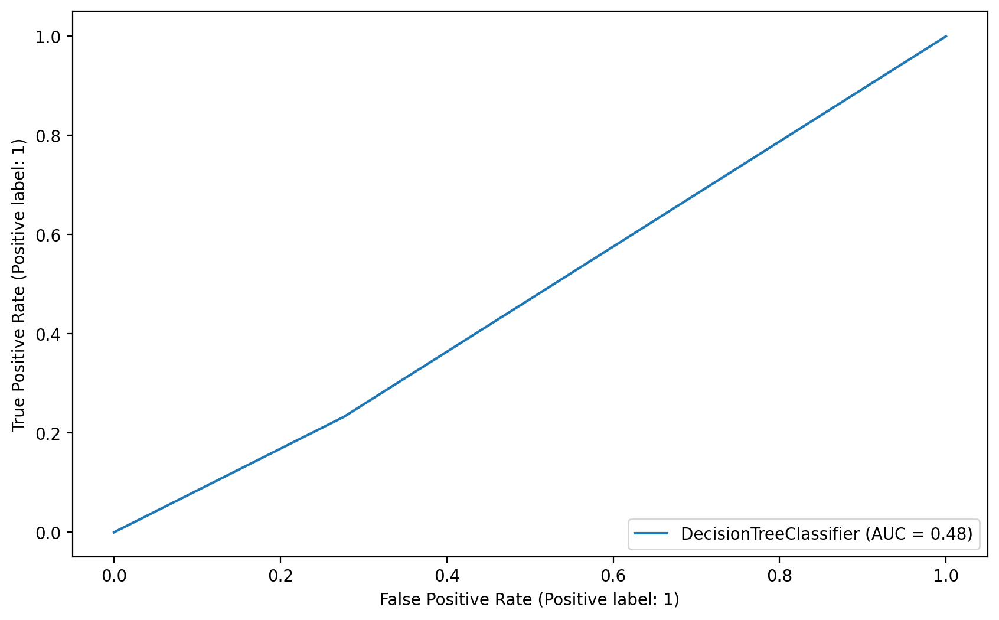

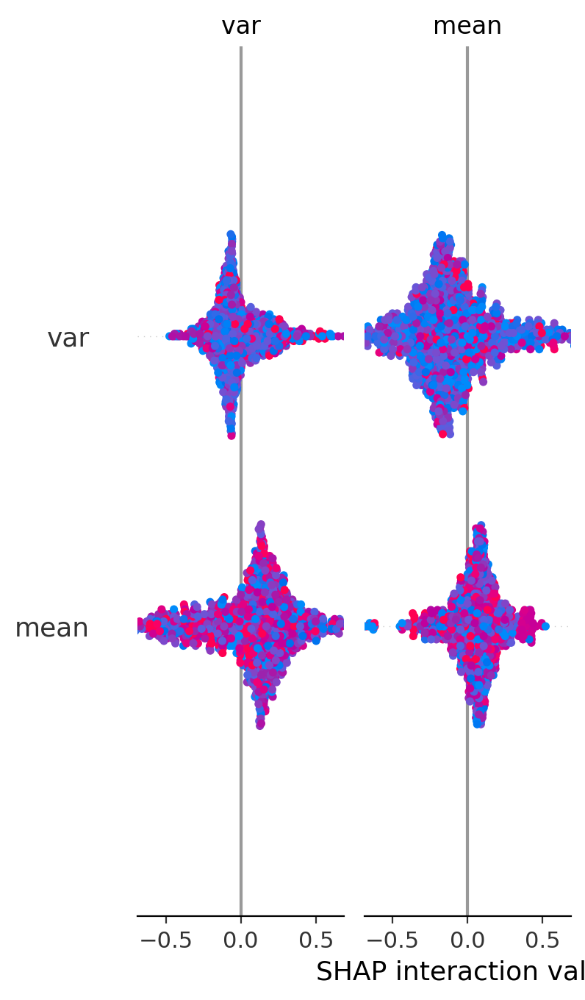

-------------------------------------------------- Gaussian Naive Bayes --------------------------------------------------
Model name: Gaussian Naive Bayes
accuracy_score: 0.72
roc_auc_score: 0.513066699917911
precision_score: 0.45714285714285713
f1_score: 0.08695652173913045


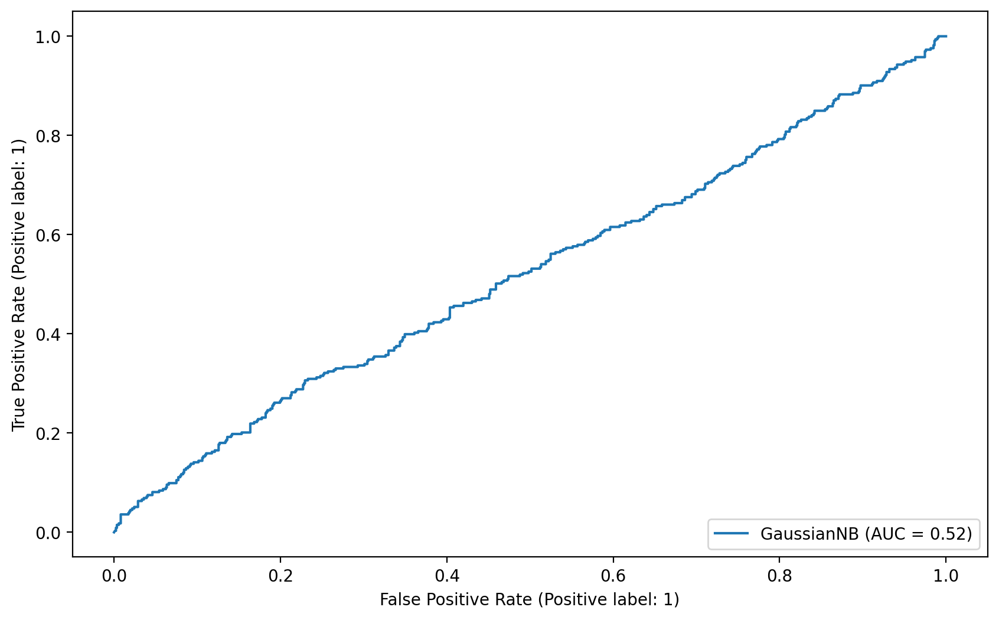

-------------------------------------------------- KNeighborsClassifier --------------------------------------------------
Model name: KNeighborsClassifier
accuracy_score: 0.71
roc_auc_score: 0.5073379535262943
precision_score: 0.2916666666666667
f1_score: 0.13861386138613863


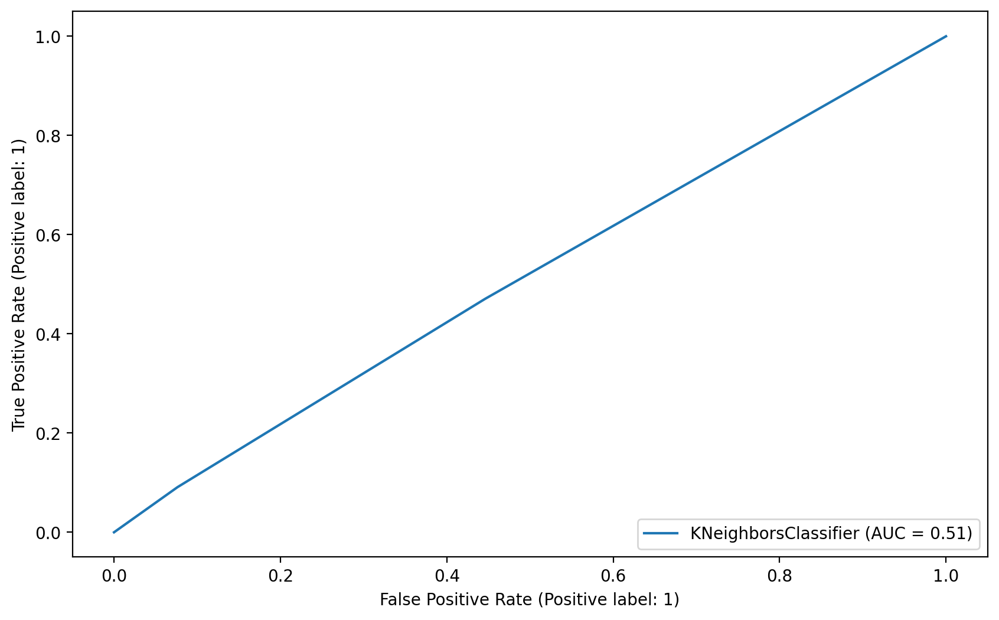

-------------------------------------------------- AdaBoostClassifier --------------------------------------------------
Model name: AdaBoostClassifier
accuracy_score: 0.7283333333333334
roc_auc_score: 0.5019639494215765
precision_score: 0.2962962962962963
f1_score: 0.04678362573099415


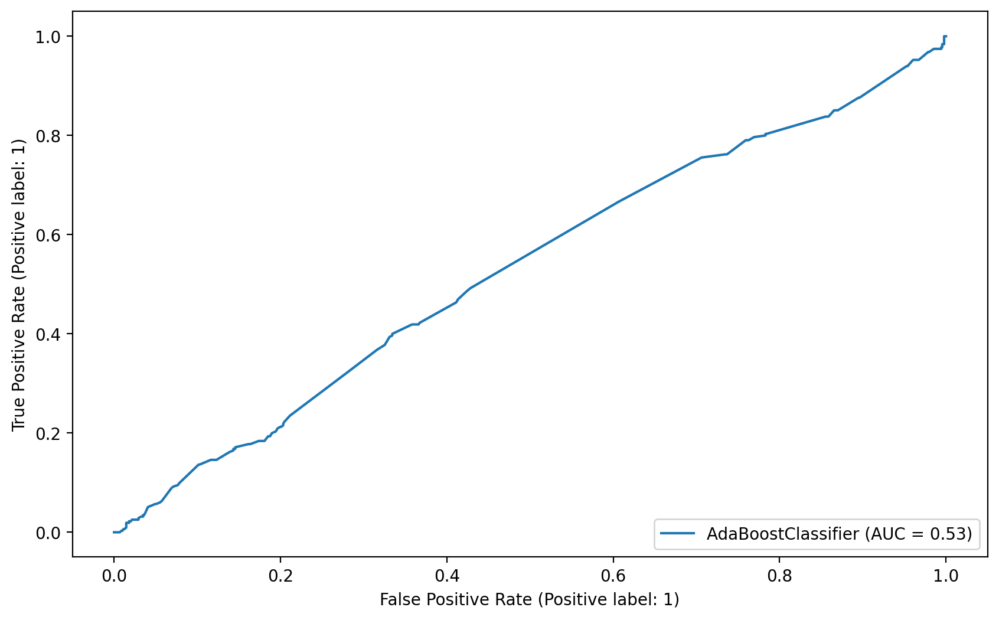

-------------------------------------------------- CatBoostClassifier --------------------------------------------------
Learning rate set to 0.020127
0:	learn: 0.6886298	total: 913us	remaining: 913ms
1:	learn: 0.6842024	total: 1.74ms	remaining: 871ms
2:	learn: 0.6800535	total: 2.61ms	remaining: 867ms
3:	learn: 0.6759756	total: 3.46ms	remaining: 862ms
4:	learn: 0.6721378	total: 4.32ms	remaining: 860ms
5:	learn: 0.6684767	total: 5.17ms	remaining: 856ms
6:	learn: 0.6649248	total: 6ms	remaining: 851ms
7:	learn: 0.6613972	total: 6.84ms	remaining: 848ms
8:	learn: 0.6579378	total: 7.7ms	remaining: 847ms
9:	learn: 0.6546401	total: 8.52ms	remaining: 843ms
10:	learn: 0.6516240	total: 9.34ms	remaining: 840ms
11:	learn: 0.6486506	total: 10.2ms	remaining: 836ms
12:	learn: 0.6458254	total: 10.9ms	remaining: 831ms
13:	learn: 0.6431475	total: 11.8ms	remaining: 830ms
14:	learn: 0.6405198	total: 12.6ms	remaining: 826ms
15:	learn: 0.6380553	total: 13.4ms	remaining: 824ms
16:	learn: 0.6357200	total: 14.2

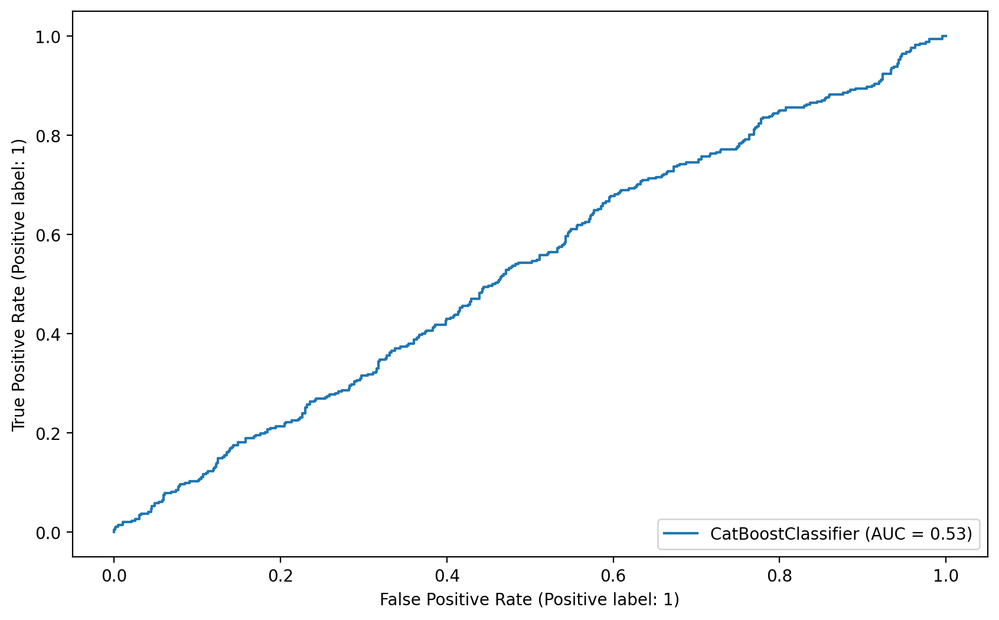

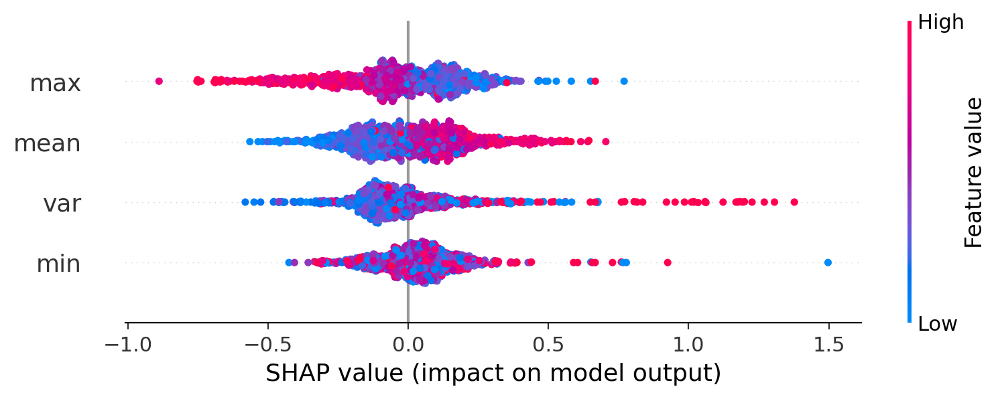

-------------------------------------------------- XGBClassifier --------------------------------------------------
Model name: XGBClassifier
accuracy_score: 0.72
roc_auc_score: 0.5255555555555556
precision_score: 0.3474576271186441
f1_score: 0.19617224880382775


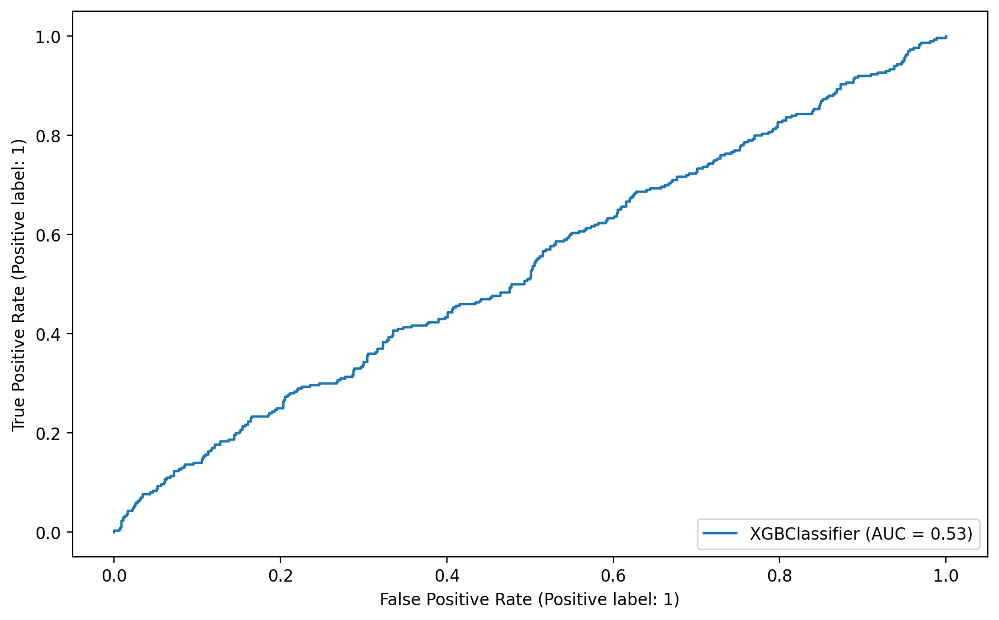

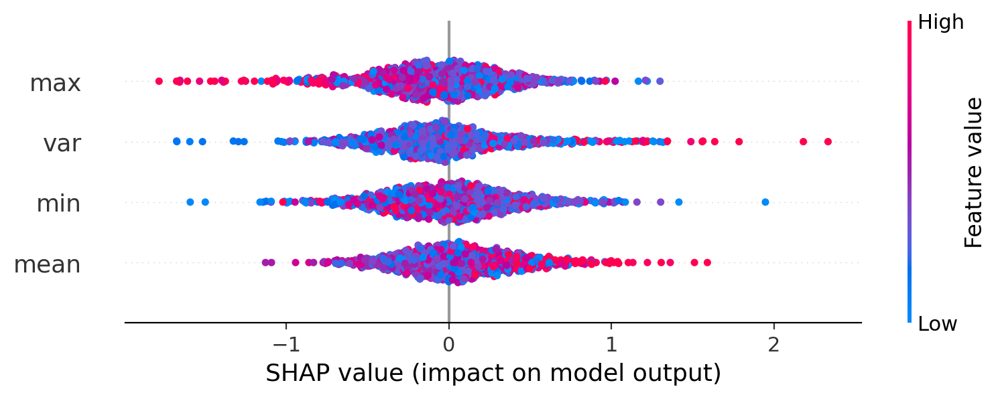

-------------------------------------------------- LGBMClassifier --------------------------------------------------
[LightGBM] [Info] Number of positive: 1336, number of negative: 3463
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 4799, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.278391 -> initscore=-0.952455
[LightGBM] [Info] Start training from score -0.952455
Model name: LGBMClassifier
accuracy_score: 0.7291666666666666
roc_auc_score: 0.5100465278458806
precision_score: 0.34615384615384615
f1_score: 0.09972299168975071


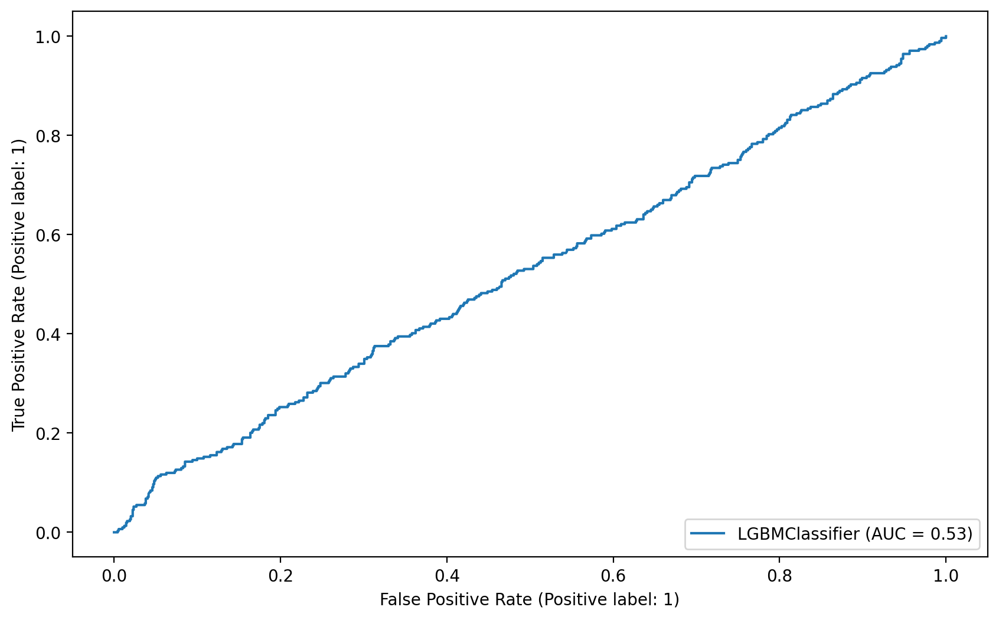

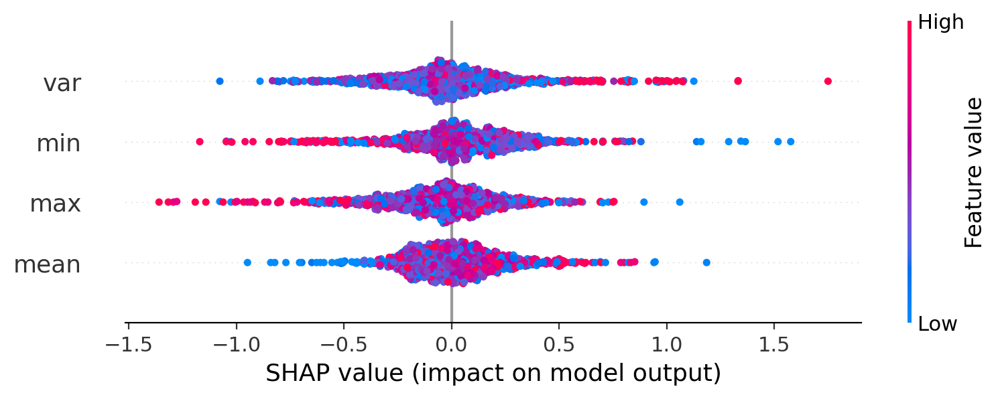

-------------------------------------------------- logistic regression --------------------------------------------------
Model name: logistic regression
accuracy_score: 0.7191666666666666
roc_auc_score: 0.4994212962962963
precision_score: 0.0
f1_score: 0.0


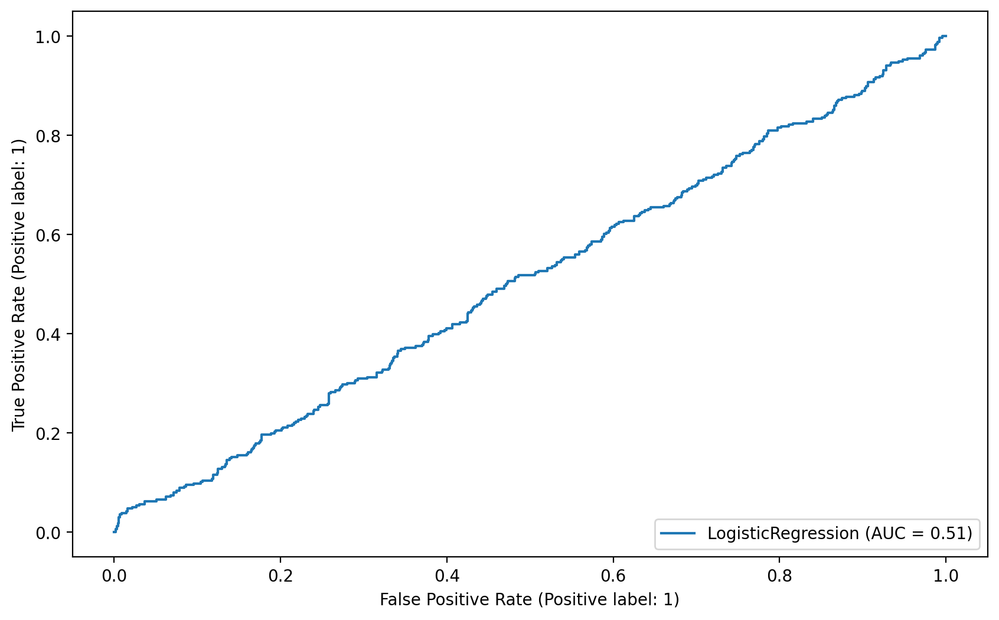

-------------------------------------------------- Support vector machine --------------------------------------------------
Model name: Support vector machine
accuracy_score: 0.7225
roc_auc_score: 0.5003888310896729
precision_score: 0.2857142857142857
f1_score: 0.02346041055718475


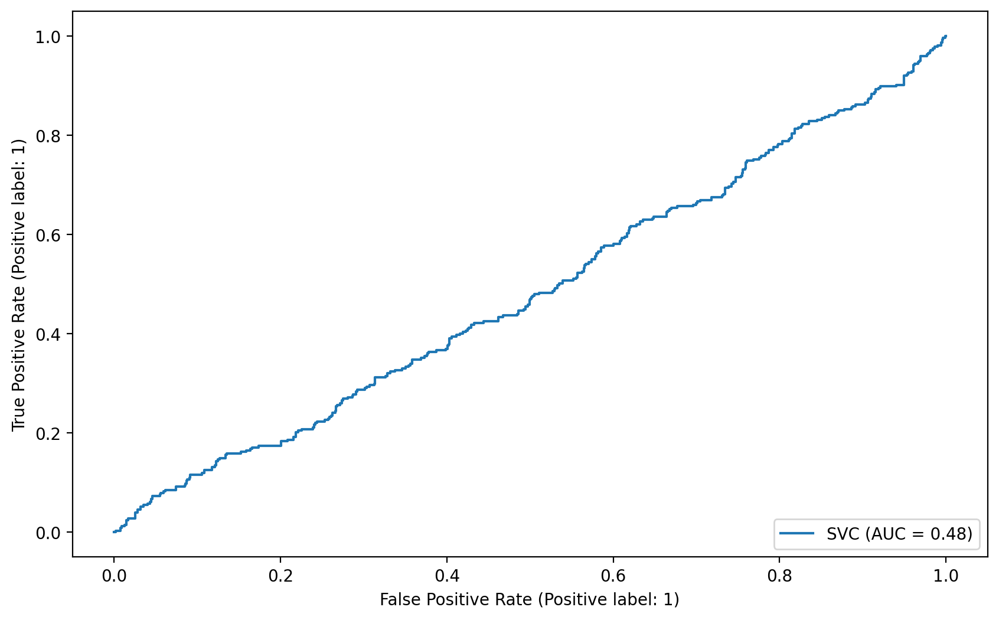

-------------------------------------------------- basic random forrest --------------------------------------------------
Model name: basic random forrest
accuracy_score: 0.6975
roc_auc_score: 0.5202017734567751
precision_score: 0.3559322033898305
f1_score: 0.1879194630872483


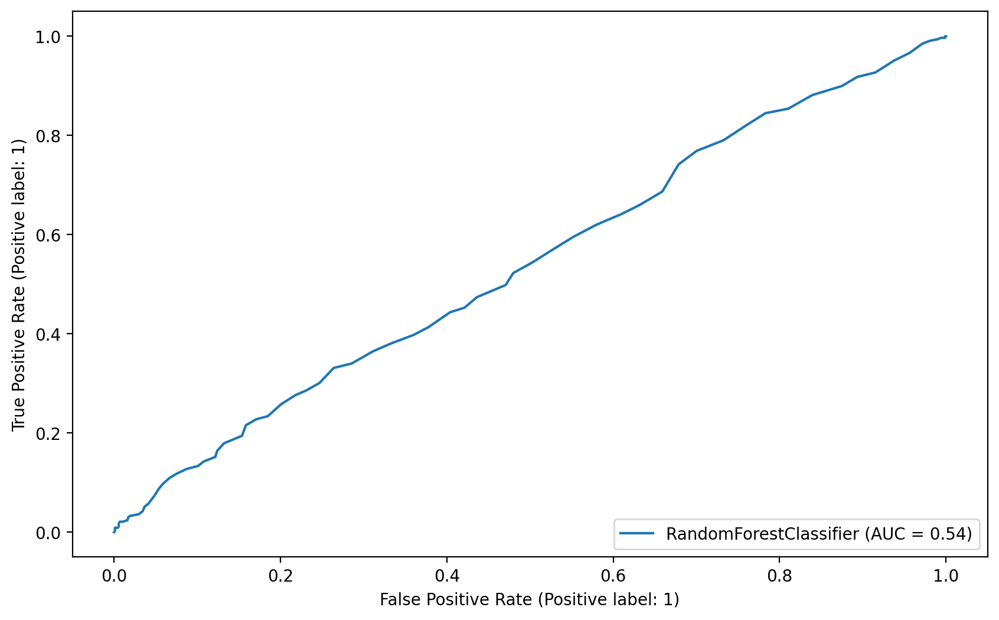

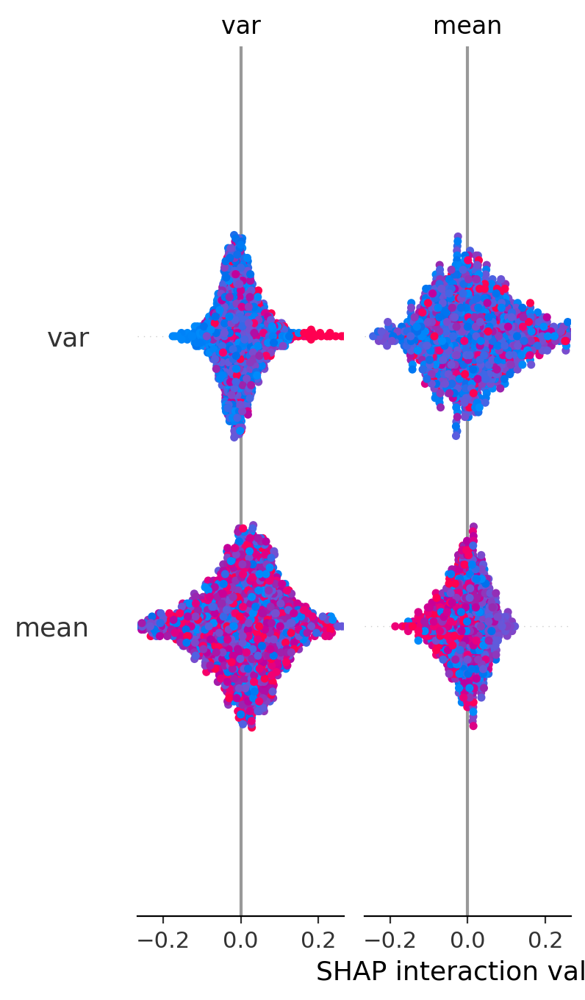

In [87]:
results=[]
for m in models:
    print("-"*50,m["name"],"-"*50)
    results.append(classify(df.drop(columns=["kurtosis","skew"]),0.2,m["model"],m["name"]))

-------------------------------------------------- decision tree --------------------------------------------------
Model name: decision tree
accuracy_score: 0.7291666666666666
roc_auc_score: 0.6474615635213383
precision_score: 0.5032894736842105
f1_score: 0.48494453248811414


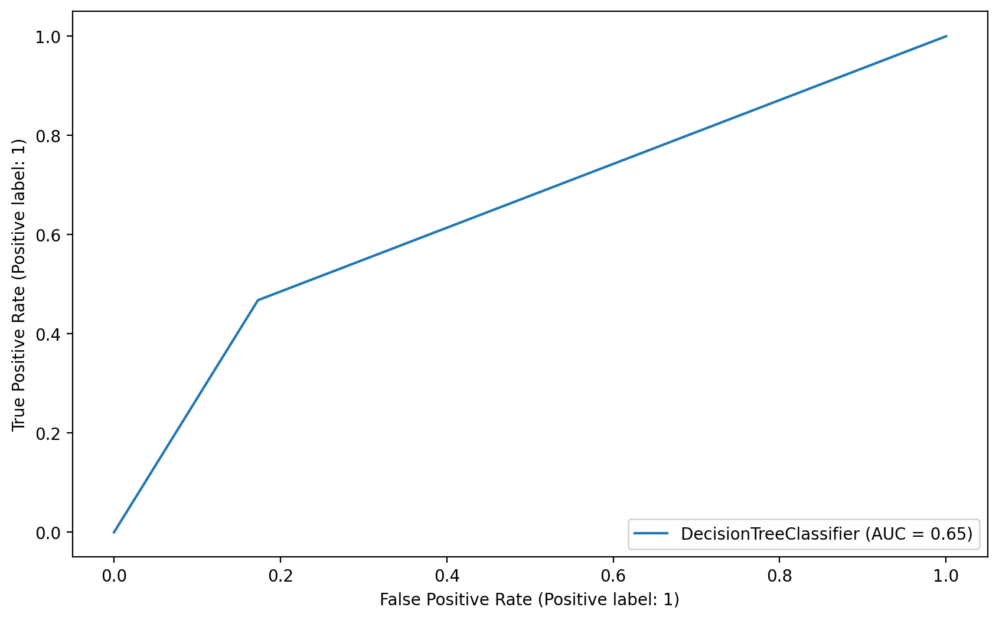

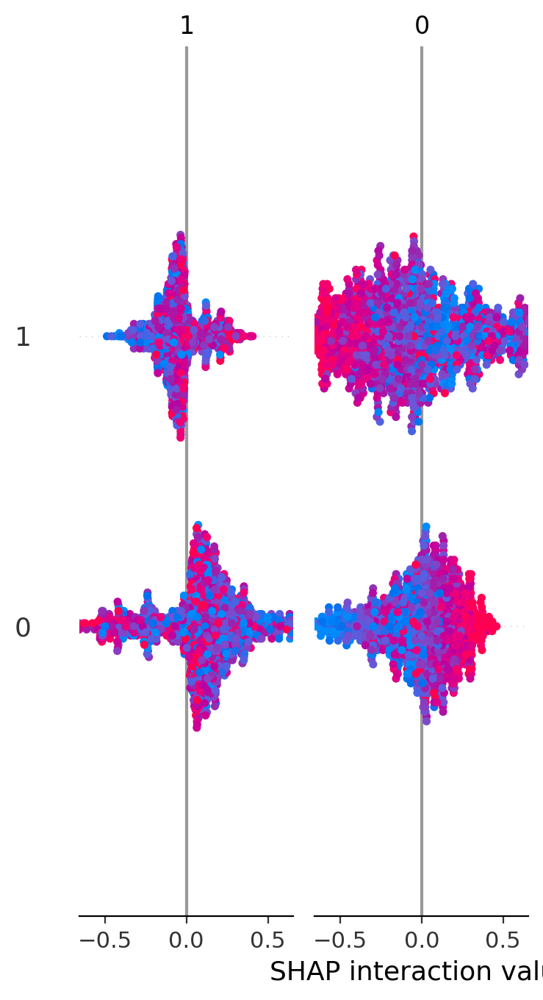

-------------------------------------------------- Gaussian Naive Bayes --------------------------------------------------
Model name: Gaussian Naive Bayes
accuracy_score: 0.7366666666666667
roc_auc_score: 0.5020333352425683
precision_score: 0.5
f1_score: 0.012499999999999999


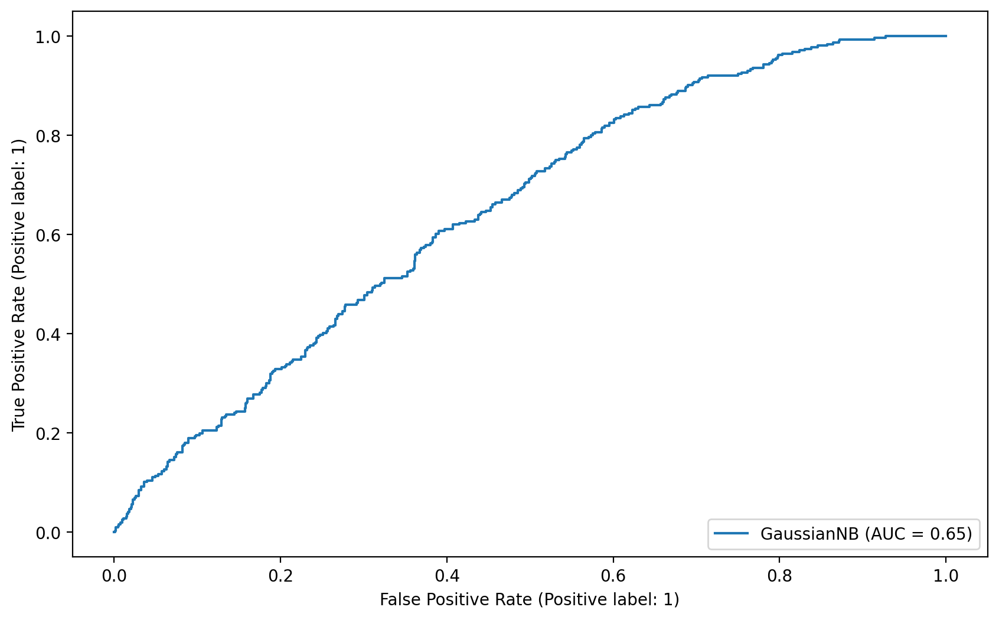

-------------------------------------------------- KNeighborsClassifier --------------------------------------------------
Model name: KNeighborsClassifier
accuracy_score: 0.7558333333333334
roc_auc_score: 0.6073717948717949
precision_score: 0.5568862275449101
f1_score: 0.3883089770354906


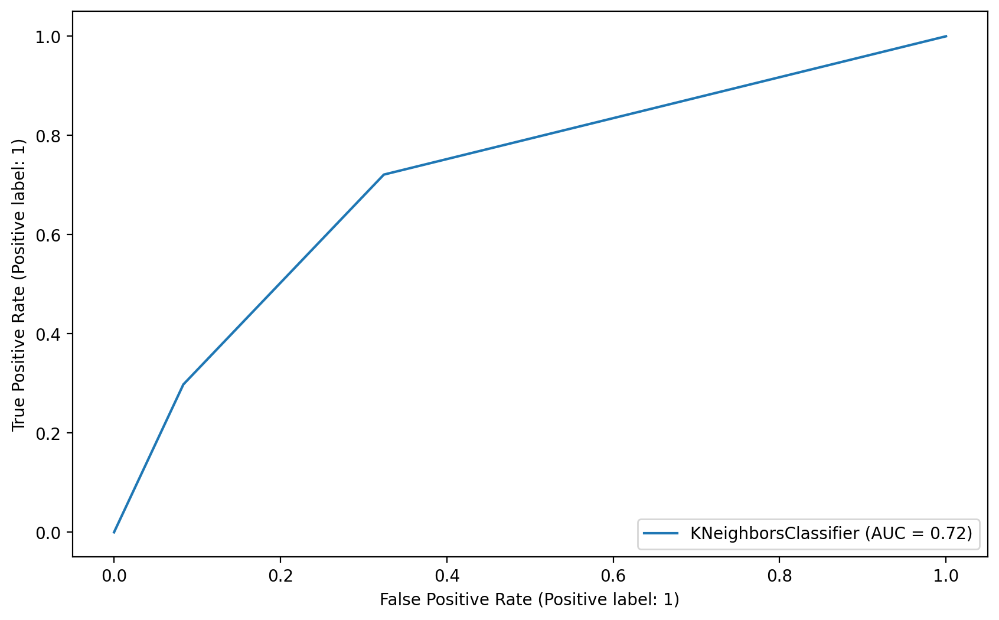

-------------------------------------------------- AdaBoostClassifier --------------------------------------------------
Model name: AdaBoostClassifier
accuracy_score: 0.7225
roc_auc_score: 0.5338873300237428
precision_score: 0.5483870967741935
f1_score: 0.16957605985037408


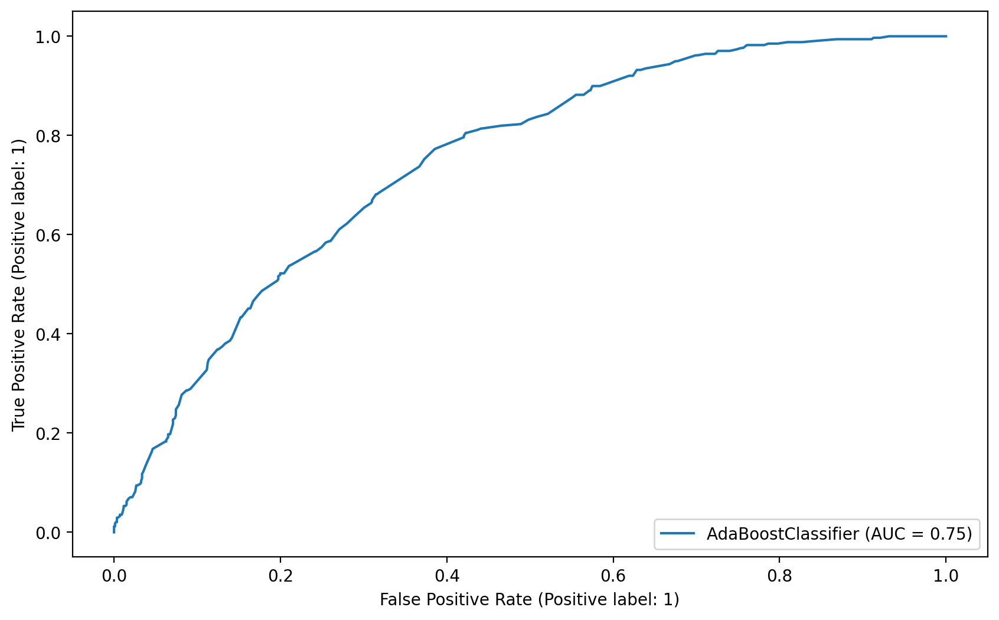

-------------------------------------------------- CatBoostClassifier --------------------------------------------------
Learning rate set to 0.020127
0:	learn: 0.6868618	total: 1.21ms	remaining: 1.21s
1:	learn: 0.6810058	total: 2.25ms	remaining: 1.12s
2:	learn: 0.6752506	total: 3.16ms	remaining: 1.05s
3:	learn: 0.6702957	total: 4.1ms	remaining: 1.02s
4:	learn: 0.6659217	total: 4.86ms	remaining: 968ms
5:	learn: 0.6607410	total: 5.69ms	remaining: 943ms
6:	learn: 0.6563600	total: 6.51ms	remaining: 924ms
7:	learn: 0.6517035	total: 7.36ms	remaining: 913ms
8:	learn: 0.6471707	total: 8.2ms	remaining: 903ms
9:	learn: 0.6428268	total: 8.99ms	remaining: 890ms
10:	learn: 0.6388515	total: 9.78ms	remaining: 879ms
11:	learn: 0.6349706	total: 10.6ms	remaining: 870ms
12:	learn: 0.6310961	total: 11.3ms	remaining: 858ms
13:	learn: 0.6278530	total: 12.1ms	remaining: 852ms
14:	learn: 0.6247559	total: 12.9ms	remaining: 847ms
15:	learn: 0.6216089	total: 13.7ms	remaining: 840ms
16:	learn: 0.6179027	total: 1

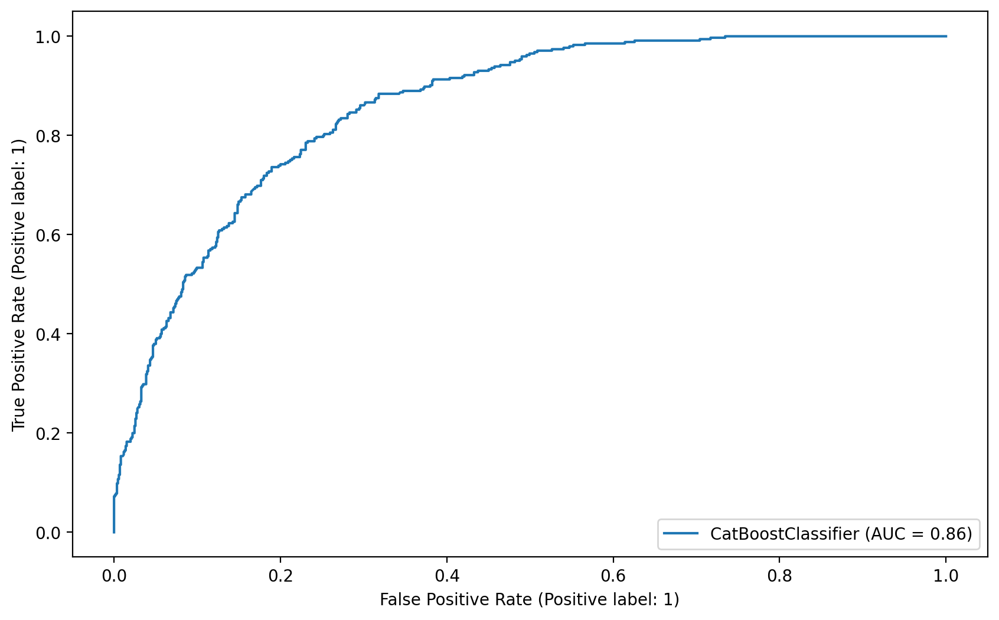

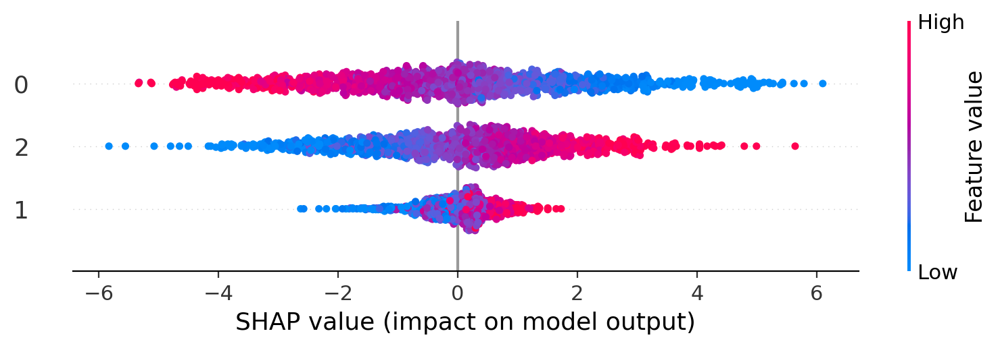

-------------------------------------------------- XGBClassifier --------------------------------------------------
Model name: XGBClassifier
accuracy_score: 0.7633333333333333
roc_auc_score: 0.6941174837599244
precision_score: 0.5774193548387097
f1_score: 0.557632398753894


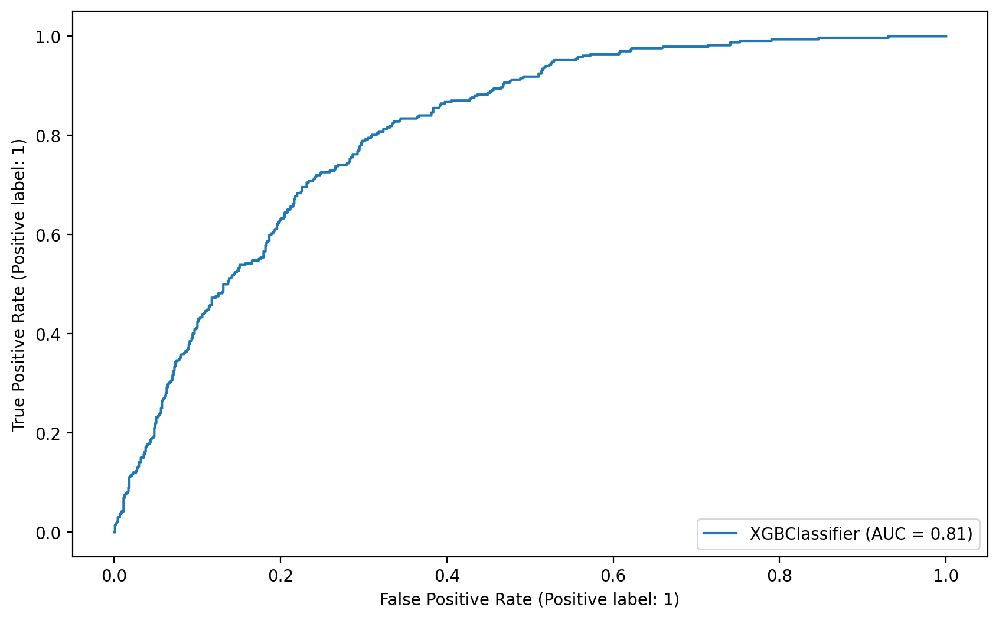

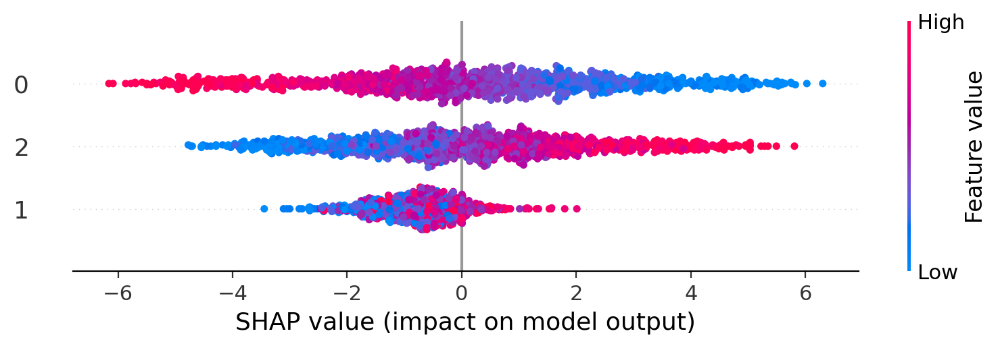

-------------------------------------------------- LGBMClassifier --------------------------------------------------
[LightGBM] [Info] Number of positive: 1353, number of negative: 3446
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 4799, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.281934 -> initscore=-0.934890
[LightGBM] [Info] Start training from score -0.934890
Model name: LGBMClassifier
accuracy_score: 0.7983333333333333
roc_auc_score: 0.7029449037475106
precision_score: 0.5992063492063492
f1_score: 0.5551470588235293


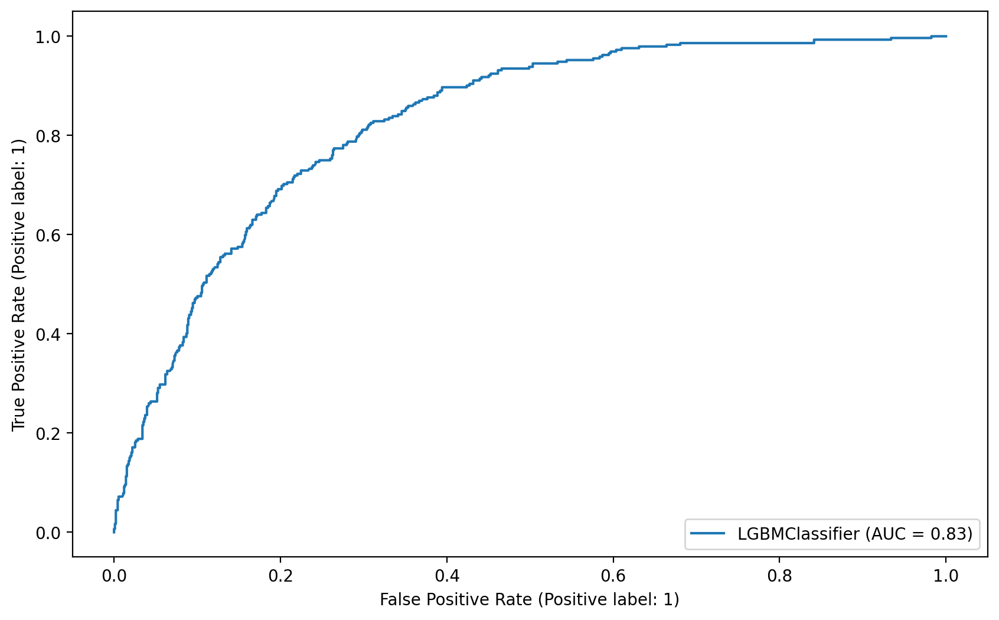

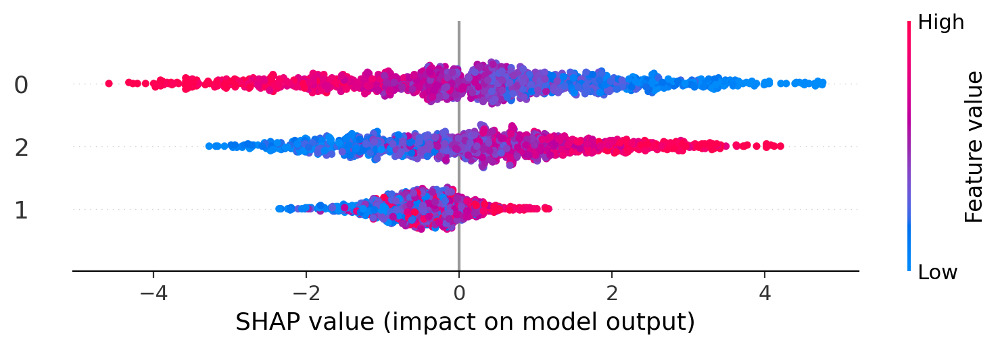

-------------------------------------------------- logistic regression --------------------------------------------------
Model name: logistic regression
accuracy_score: 0.7383333333333333
roc_auc_score: 0.6162101215104748
precision_score: 0.5978835978835979
f1_score: 0.41851851851851857


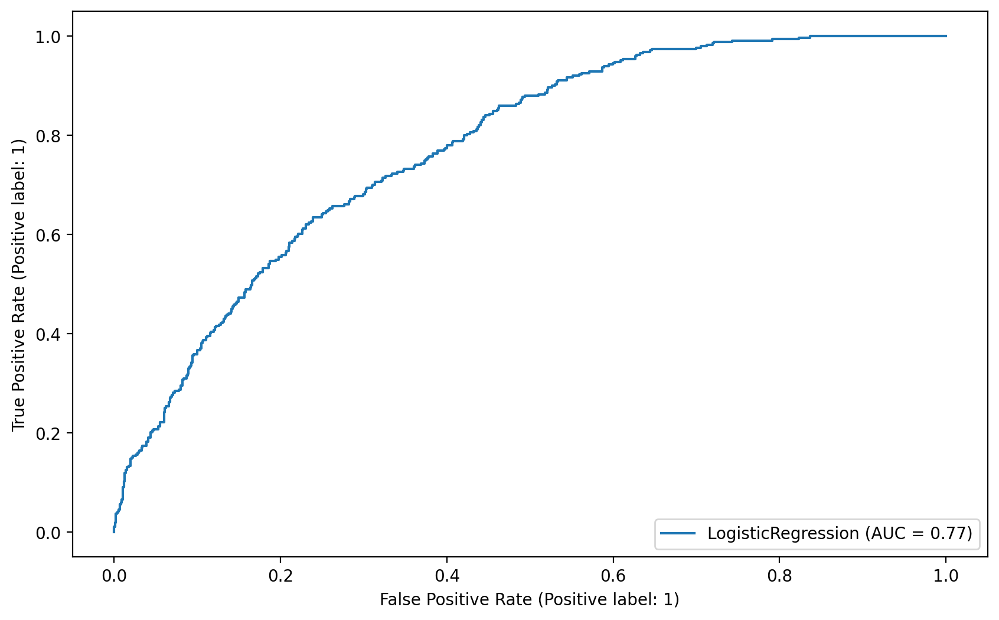

-------------------------------------------------- Support vector machine --------------------------------------------------
Model name: Support vector machine
accuracy_score: 0.7533333333333333
roc_auc_score: 0.5636309825807543
precision_score: 0.7
f1_score: 0.24873096446700507


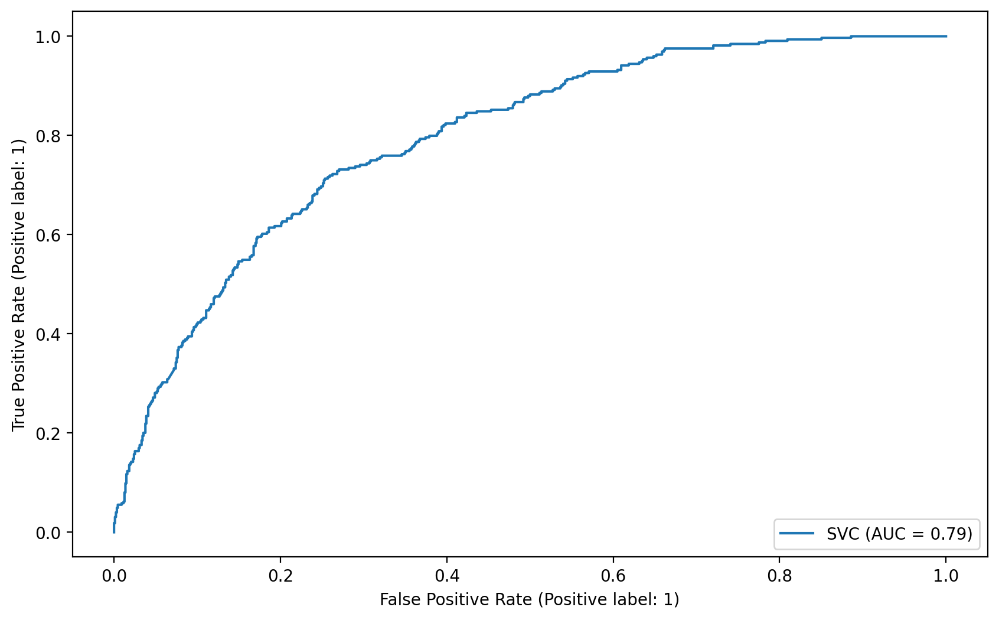

-------------------------------------------------- basic random forrest --------------------------------------------------
Model name: basic random forrest
accuracy_score: 0.7591666666666667
roc_auc_score: 0.6590550967181047
precision_score: 0.6160337552742616
f1_score: 0.5025817555938038


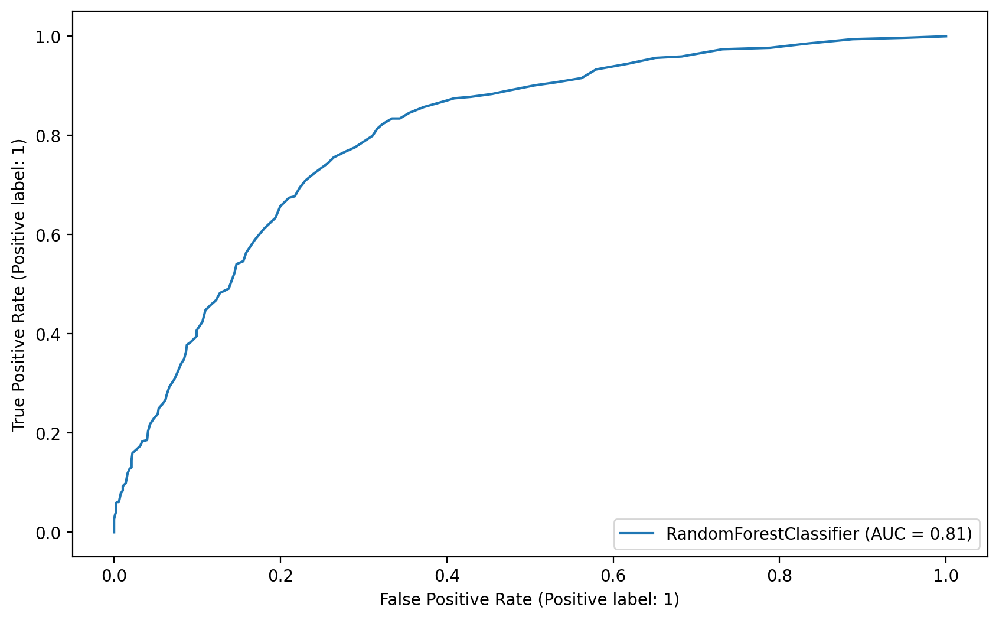

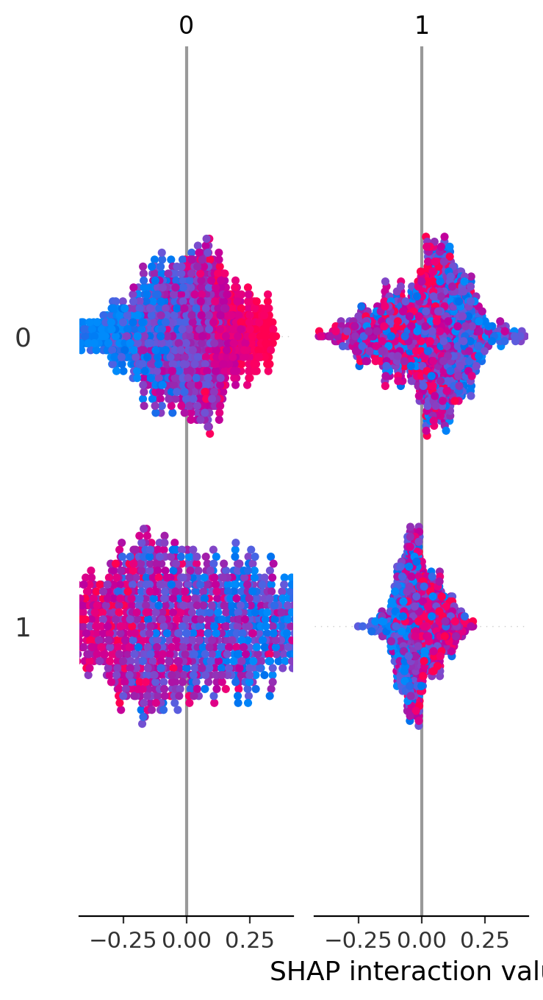

In [56]:
results=[]
for m in models:
    print("-"*50,m["name"],"-"*50)
    results.append(classify(df_interval.drop("3",axis=1),0.2,m["model"],m["name"]))

*compare the results*

In [81]:
compare_model_results(results)


                        Accuracy  Precision  Recall      F1
LGBMClassifier            0.7742     0.5891  0.5062  0.5445
basic random forrest      0.7608     0.6213  0.4788  0.5408
decision tree             0.7467     0.5329  0.5460  0.5394
XGBClassifier             0.7642     0.6265  0.4509  0.5244
CatBoostClassifier        0.7692     0.6202  0.3945  0.4822
logistic regression       0.7508     0.6182  0.3018  0.4056
KNeighborsClassifier      0.7550     0.5786  0.2884  0.3849
Support vector machine    0.7758     0.7229  0.1961  0.3085
AdaBoostClassifier        0.7358     0.5663  0.1433  0.2287
Gaussian Naive Bayes      0.7092     0.0000  0.0000  0.0000


### 2.4 best features selection
in this section we will take all the featurs from previous section and attempt to classify using all of them

In [122]:
df_interval=df_interval.sort_index()
df_interval=df_interval.drop("3",axis=1)

parsed_details=parsed_details.sort_index()
df=df.sort_index()
df=df.drop(columns=["kurtosis","skew"])

join_df=df.copy()

for c in parsed_details.columns:
    join_df[c]=parsed_details[c]
for c in df_interval.columns:
    join_df[c]=df_interval[c]
join_df

,mean,var,min,max,Label,ECO_A,ECO_B,ECO_C,ECO_D,ECO_E,PlyCountMean,PlyCountVar,PlyCountSkew,TotalGames,0,1,2
ABCi,1463.333333,739.022222,1406,1502,0,20.000000,26.666667,0.000000,26.666667,26.666667,67.533333,683.048889,0.758514,15,1458.0,1429.0,1457.0
ABSBEGINNER,1344.142276,1451.811736,1241,1426,0,5.826558,23.983740,56.436314,13.346883,0.406504,79.505420,984.621244,0.525922,1476,1317.0,1356.0,1289.0
ADJUSTOR,1878.373218,1864.929391,1745,1994,0,18.660907,35.485961,36.090713,0.215983,9.546436,75.049676,518.122802,0.190994,4630,1893.0,1862.0,1917.0
AFCERGY,1571.542036,1115.665047,1461,1677,0,26.934436,30.379996,0.472534,30.399685,11.813349,85.253790,882.118894,-0.074684,5079,1532.0,1637.0,1600.0
AFRF,1364.376000,1022.746624,1278,1456,0,20.840000,55.560000,23.080000,0.440000,0.080000,65.696400,870.892227,1.512712,2500,1353.0,1387.0,1285.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zwartspeler,1821.970471,1499.353478,1724,1925,0,29.130088,29.449322,1.436552,20.430966,19.553073,81.717478,888.628880,0.479423,1253,1821.0,1818.0,1812.0
zwirek,985.571429,452.530612,951,1016,1,42.857143,14.285714,14.285714,28.571429,0.000000,74.428571,1457.959184,0.729793,7,951.0,963.0,1016.0
zxtxf,1332.290323,1331.109261,1252,1408,0,58.064516,25.806452,6.451613,6.451613,3.225806,69.483871,743.798127,0.253001,31,1331.0,1362.0,1309.0
zyrq,1478.447326,2225.900386,1373,1590,0,20.907618,36.628849,11.669368,30.470016,0.324149,63.868720,806.648892,0.699075,617,1496.0,1464.0,1402.0


*run classification models*

-------------------------------------------------- decision tree --------------------------------------------------
Model name: decision tree
accuracy_score: 0.6941666666666667
roc_auc_score: 0.6177637822448452
precision_score: 0.45151515151515154
f1_score: 0.4481203007518797


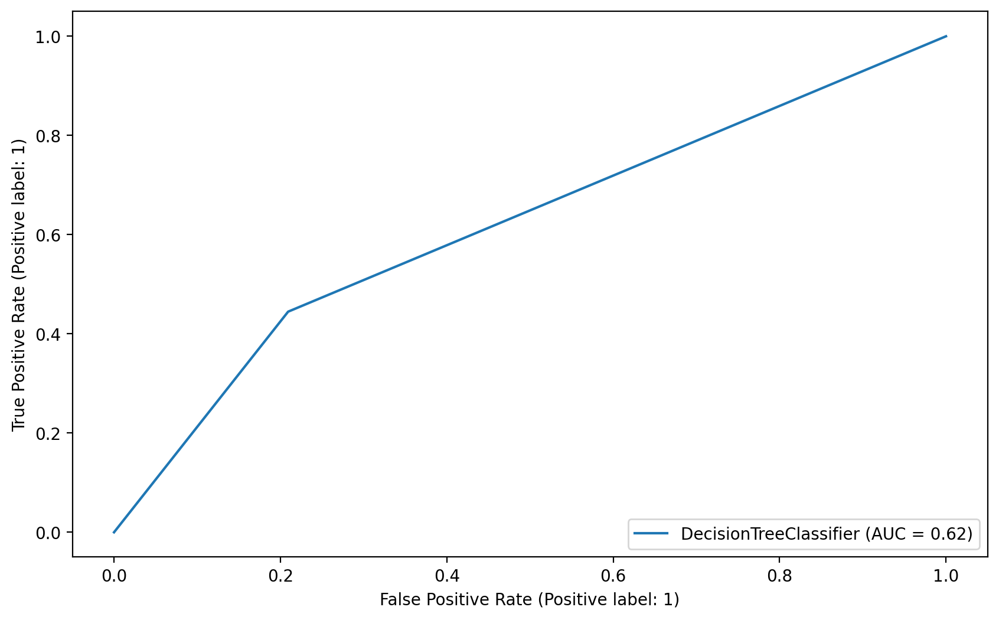

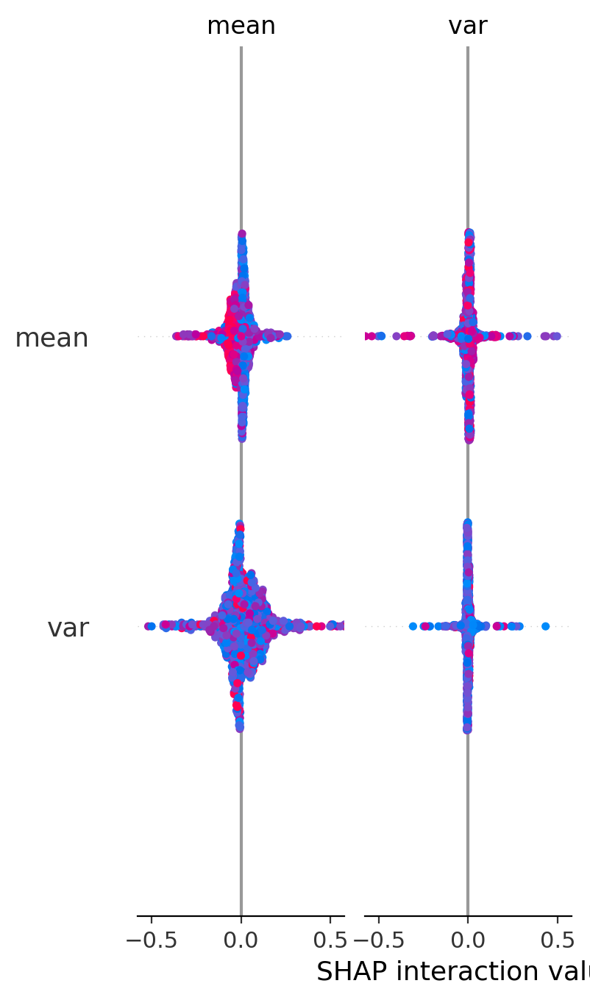

-------------------------------------------------- Gaussian Naive Bayes --------------------------------------------------
Model name: Gaussian Naive Bayes
accuracy_score: 0.72
roc_auc_score: 0.5201387334974267
precision_score: 0.43333333333333335
f1_score: 0.13402061855670105


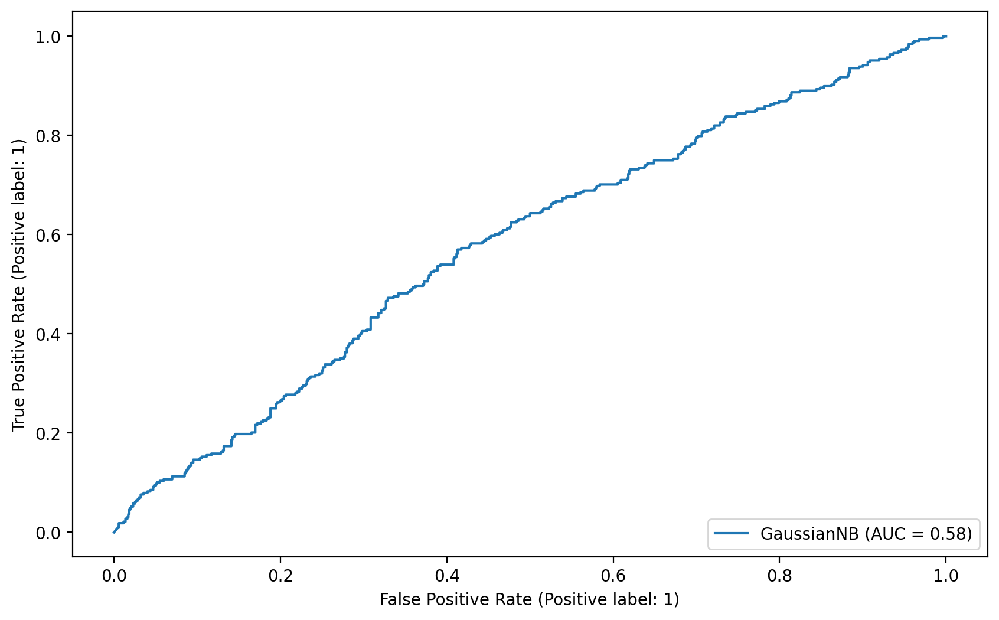

-------------------------------------------------- KNeighborsClassifier --------------------------------------------------
Model name: KNeighborsClassifier
accuracy_score: 0.6816666666666666
roc_auc_score: 0.5068904144419017
precision_score: 0.32038834951456313
f1_score: 0.14732142857142858


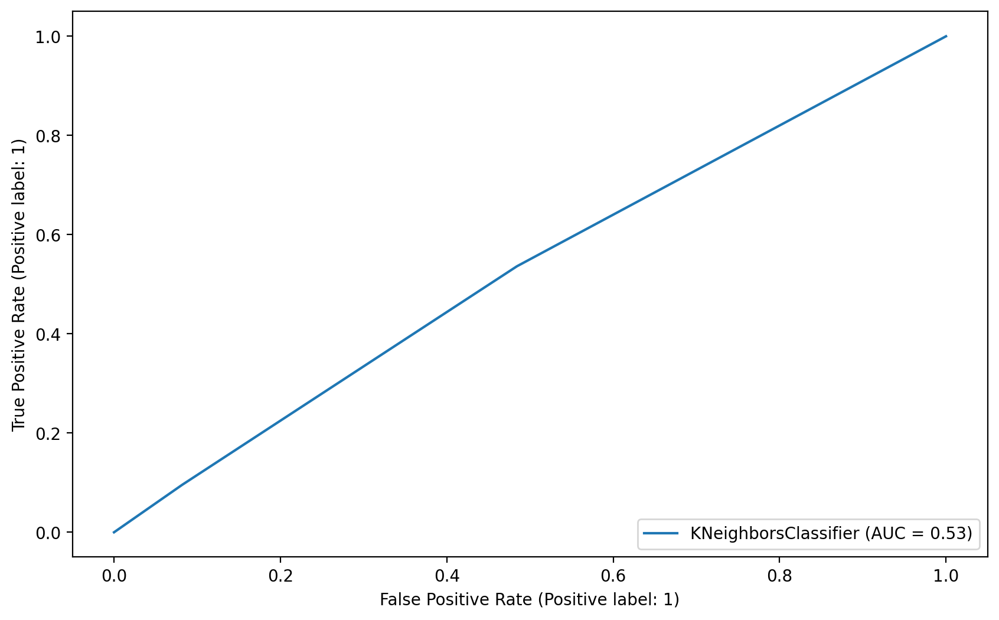

-------------------------------------------------- AdaBoostClassifier --------------------------------------------------
Model name: AdaBoostClassifier
accuracy_score: 0.735
roc_auc_score: 0.5341847430796218
precision_score: 0.5
f1_score: 0.1761658031088083


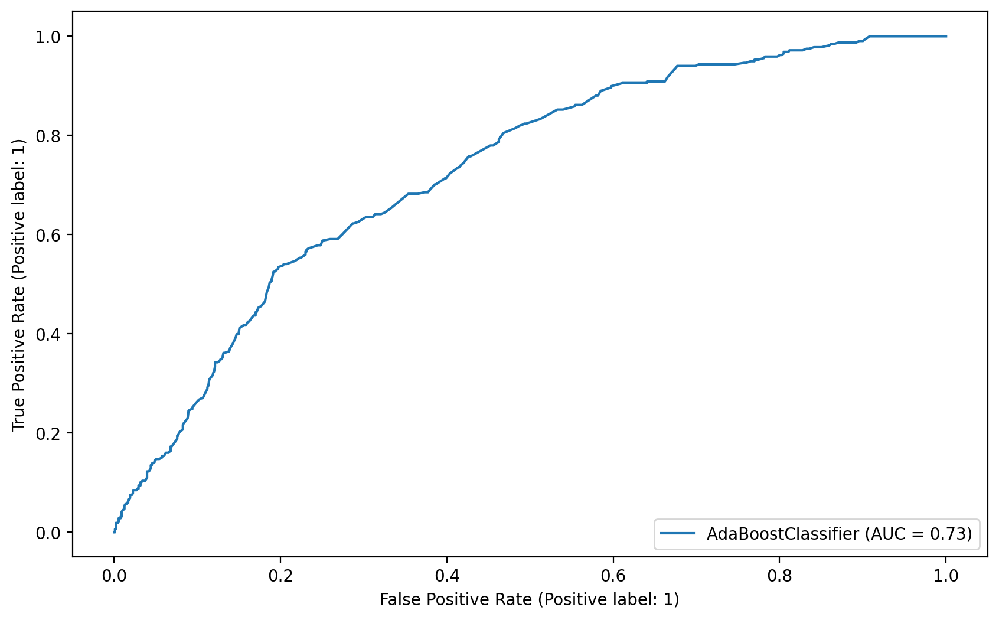

-------------------------------------------------- CatBoostClassifier --------------------------------------------------
Learning rate set to 0.020127
0:	learn: 0.6885606	total: 1.22ms	remaining: 1.21s
1:	learn: 0.6838449	total: 2.15ms	remaining: 1.07s
2:	learn: 0.6785350	total: 3.02ms	remaining: 1s
3:	learn: 0.6745001	total: 3.9ms	remaining: 972ms
4:	learn: 0.6706890	total: 4.91ms	remaining: 978ms
5:	learn: 0.6664473	total: 5.87ms	remaining: 972ms
6:	learn: 0.6623249	total: 6.83ms	remaining: 970ms
7:	learn: 0.6588189	total: 7.87ms	remaining: 975ms
8:	learn: 0.6548113	total: 8.83ms	remaining: 973ms
9:	learn: 0.6505243	total: 9.83ms	remaining: 973ms
10:	learn: 0.6465555	total: 10.7ms	remaining: 963ms
11:	learn: 0.6424213	total: 11.6ms	remaining: 954ms
12:	learn: 0.6390098	total: 12.5ms	remaining: 946ms
13:	learn: 0.6359013	total: 13.4ms	remaining: 945ms
14:	learn: 0.6332883	total: 14.4ms	remaining: 945ms
15:	learn: 0.6299821	total: 15.4ms	remaining: 945ms
16:	learn: 0.6267404	total: 16.

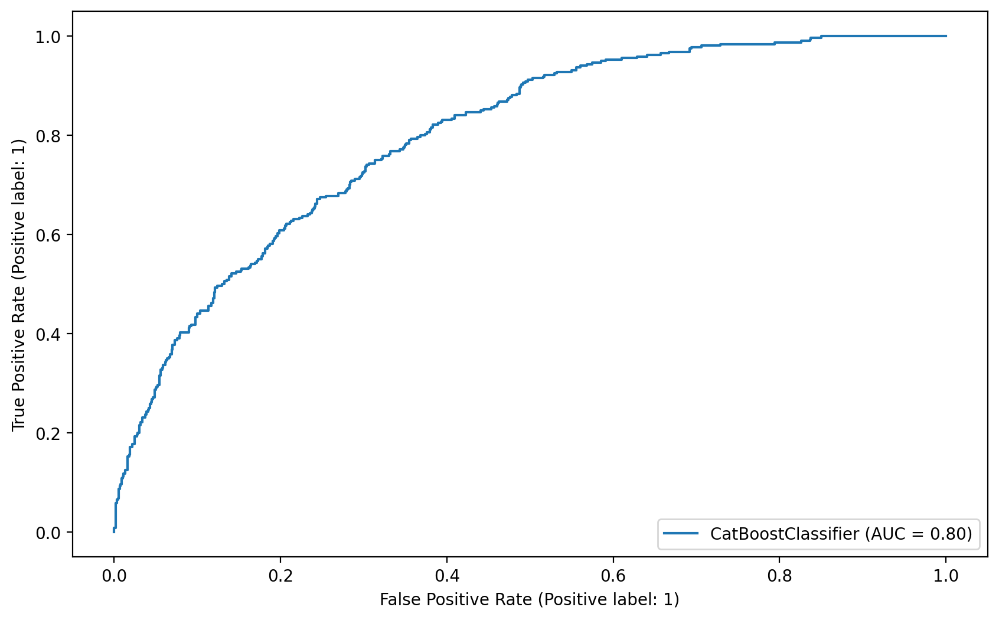

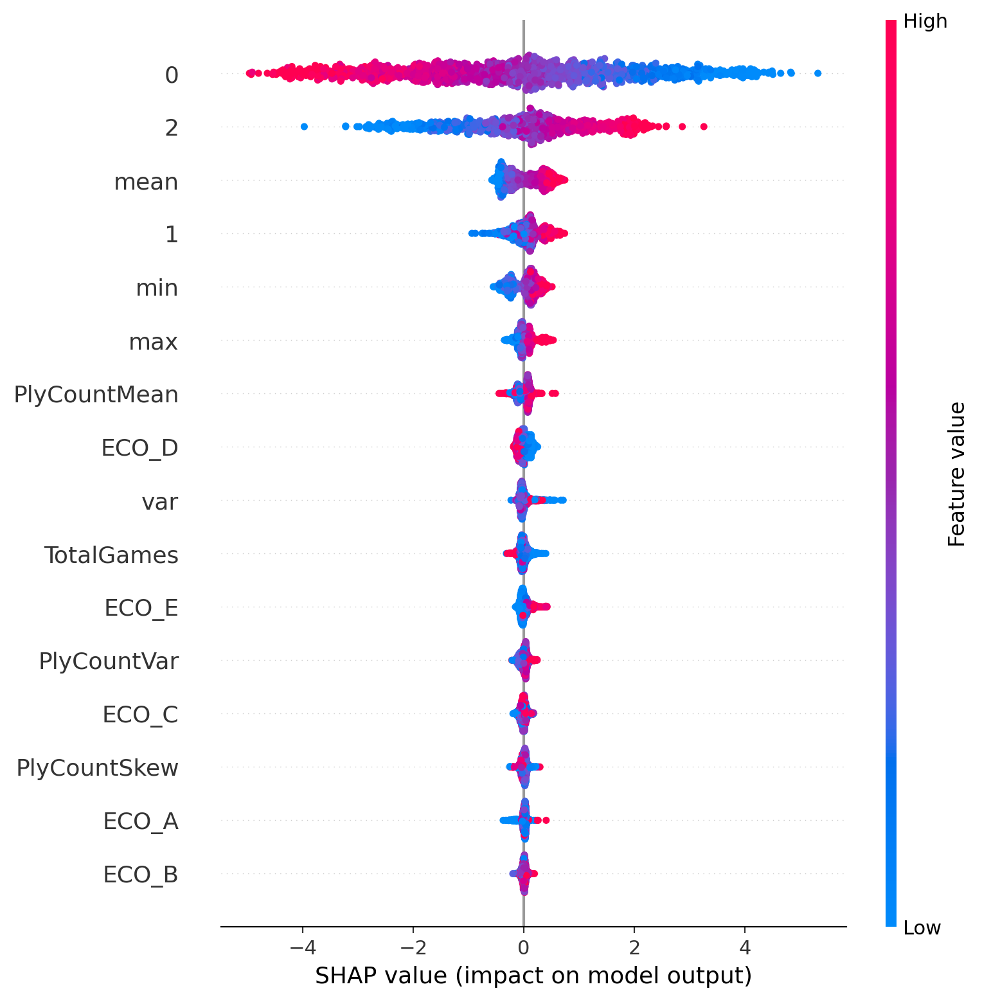

-------------------------------------------------- XGBClassifier --------------------------------------------------
Model name: XGBClassifier
accuracy_score: 0.7558333333333334
roc_auc_score: 0.642147845312226
precision_score: 0.602803738317757
f1_score: 0.4682395644283122


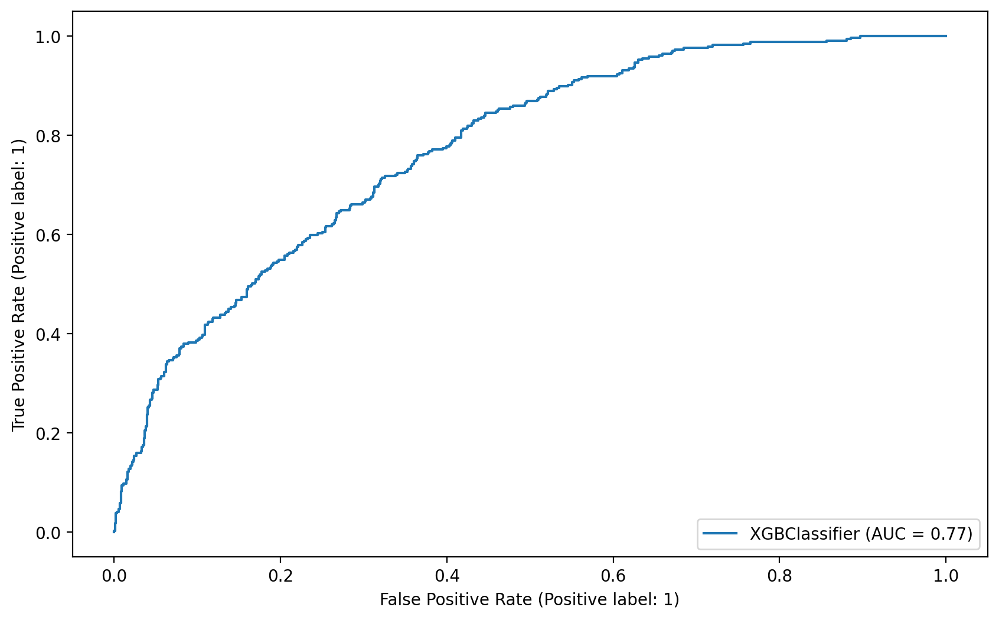

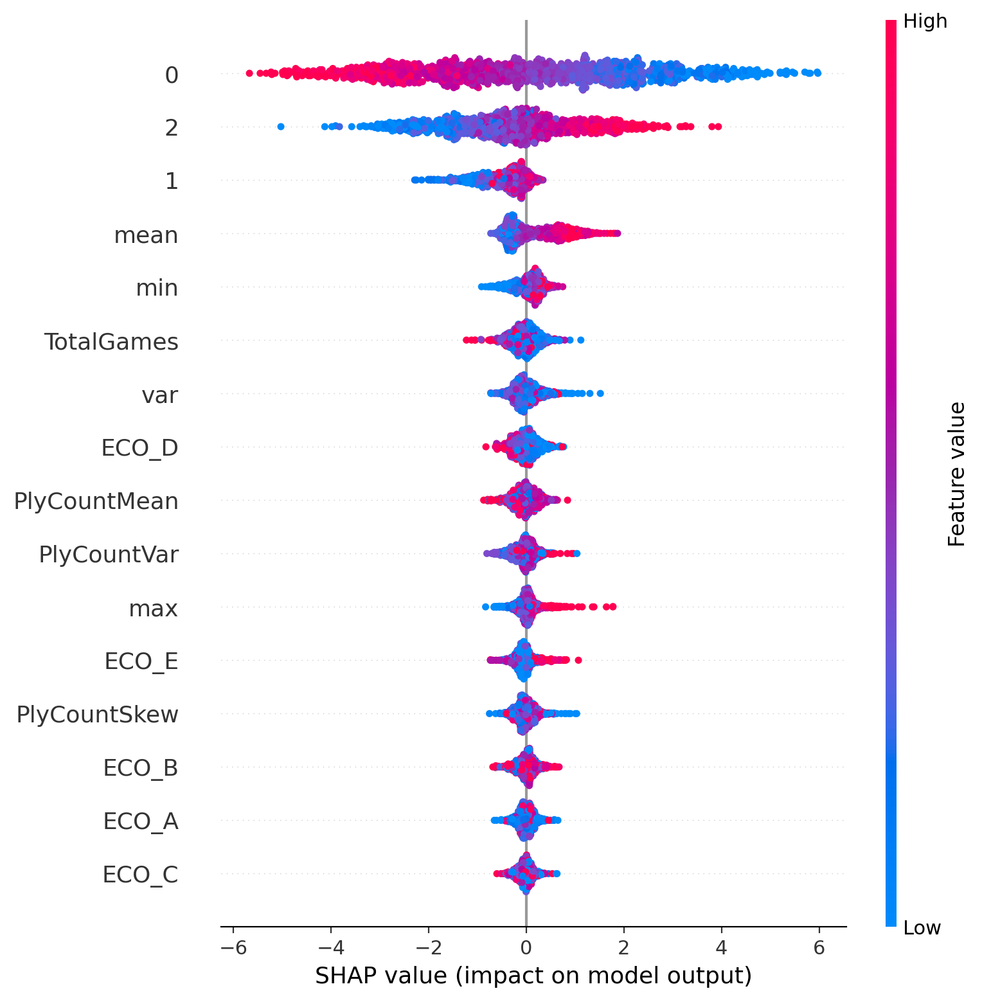

-------------------------------------------------- LGBMClassifier --------------------------------------------------
[LightGBM] [Info] Number of positive: 1336, number of negative: 3463
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 4799, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.278391 -> initscore=-0.952455
[LightGBM] [Info] Start training from score -0.952455
Model name: LGBMClassifier
accuracy_score: 0.7783333333333333
roc_auc_score: 0.6699900842295665
precision_score: 0.592274678111588
f1_score: 0.5092250922509226


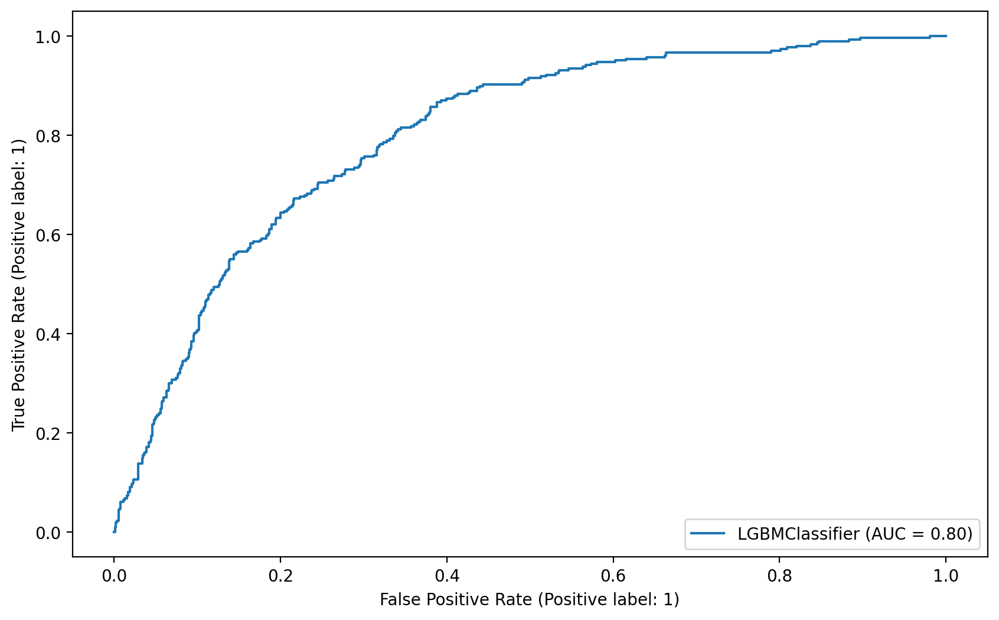

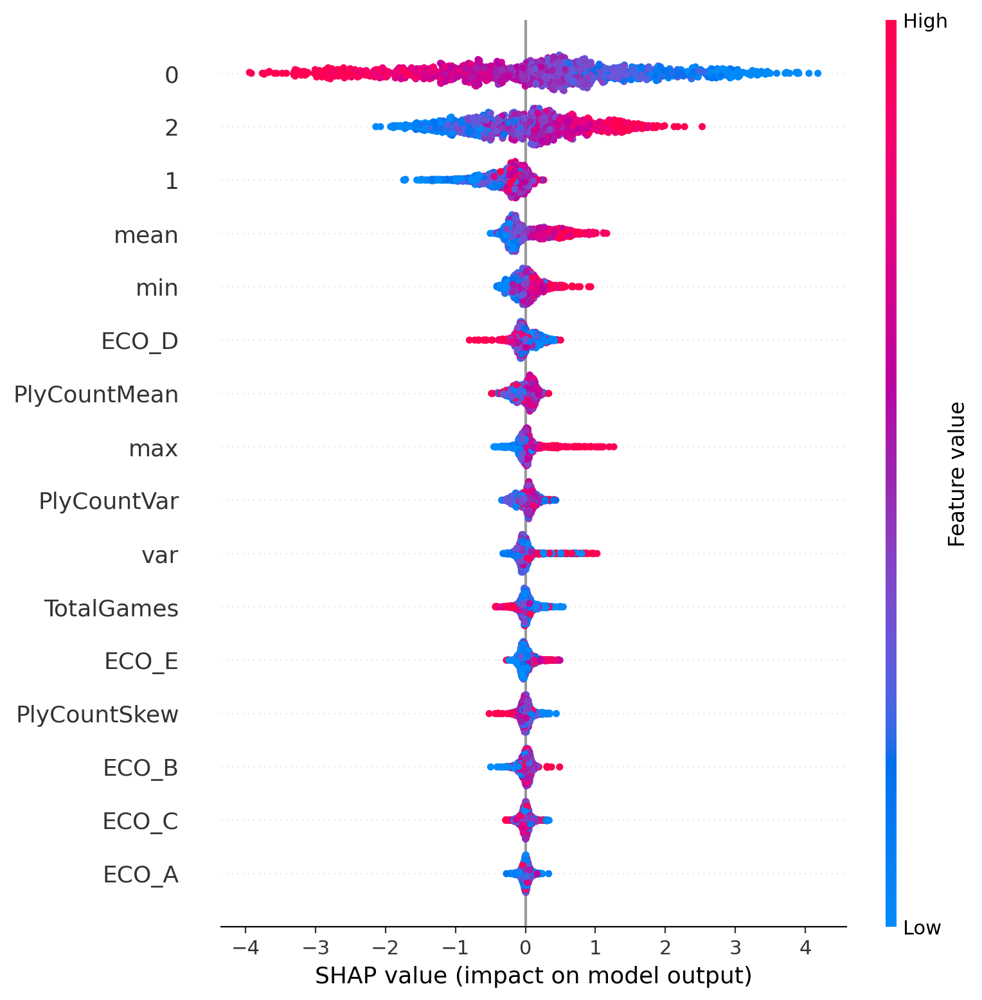

-------------------------------------------------- logistic regression --------------------------------------------------
Model name: logistic regression
accuracy_score: 0.7616666666666667
roc_auc_score: 0.6414493696854795
precision_score: 0.5857142857142857
f1_score: 0.46240601503759404


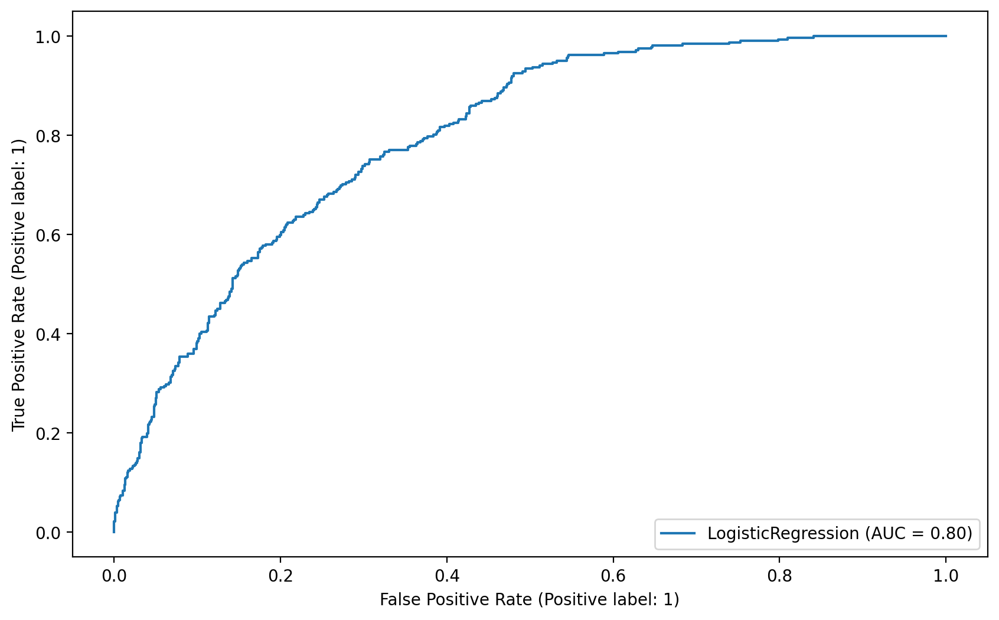

-------------------------------------------------- Support vector machine --------------------------------------------------
Model name: Support vector machine
accuracy_score: 0.73
roc_auc_score: 0.5007102272727272
precision_score: 0.3
f1_score: 0.01818181818181818


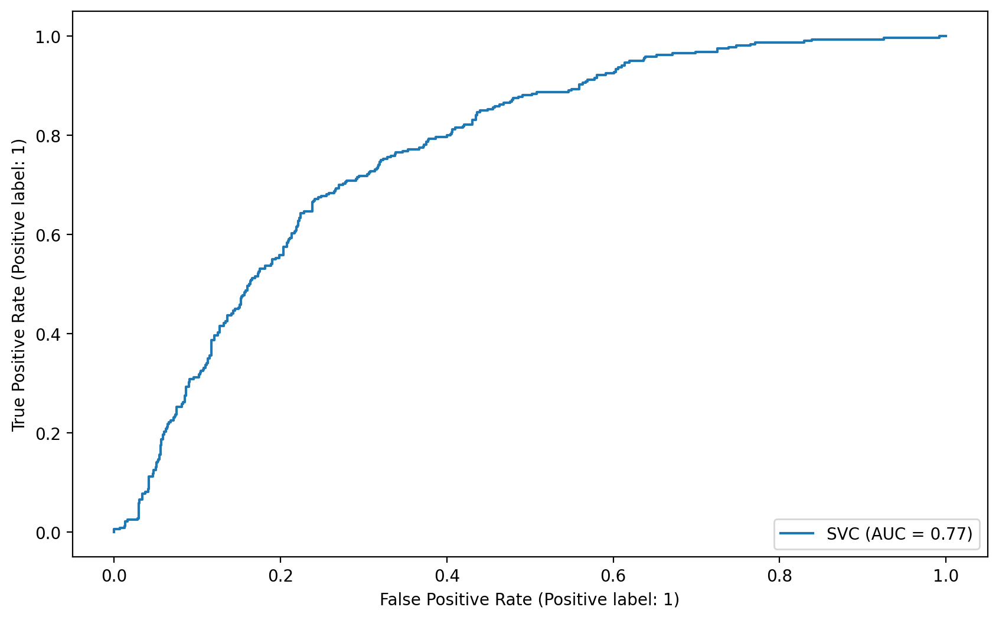

-------------------------------------------------- basic random forrest --------------------------------------------------
Model name: basic random forrest
accuracy_score: 0.7633333333333333
roc_auc_score: 0.6007314524555903
precision_score: 0.7053571428571429
f1_score: 0.3574660633484163


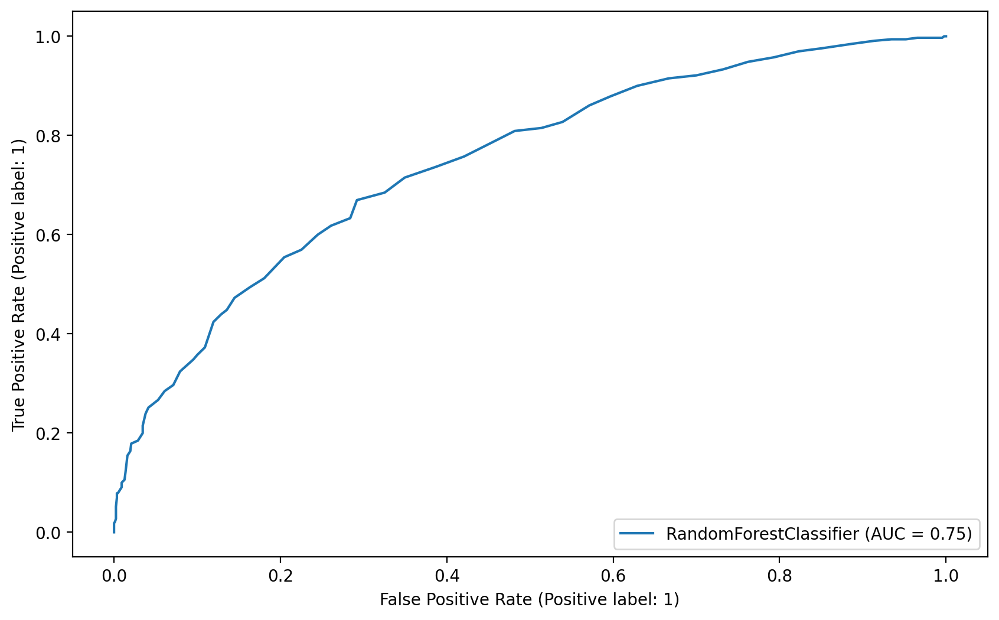

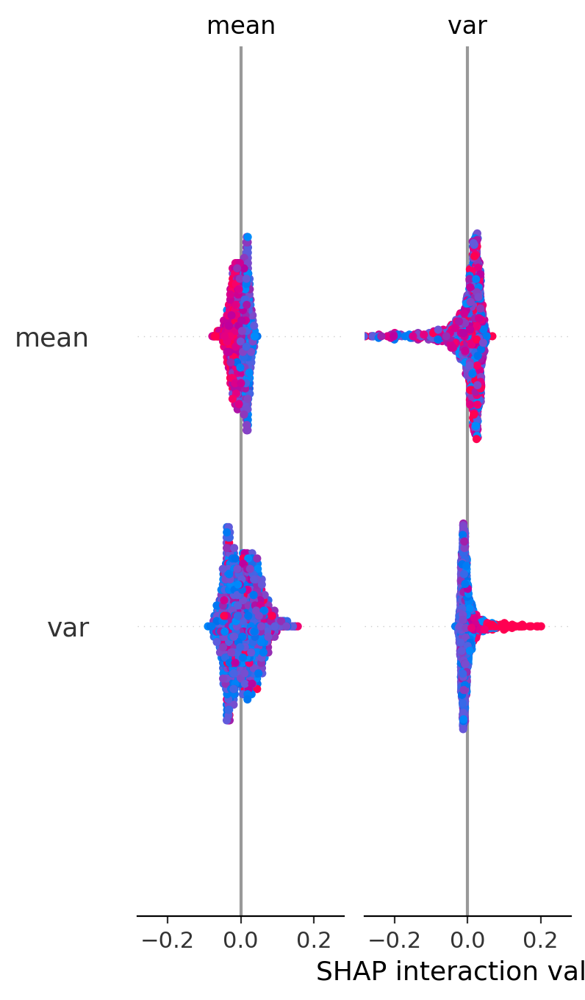

In [125]:
results=[]
for m in models:
    print("-"*50,m["name"],"-"*50)
    results.append(classify(join_df,0.2,m["model"],m["name"]))

*compare results*

In [126]:
compare_model_results(results)


                        Accuracy  Precision  Recall      F1
LGBMClassifier            0.7783     0.5923  0.4466  0.5092
XGBClassifier             0.7558     0.6028  0.3828  0.4682
logistic regression       0.7617     0.5857  0.3820  0.4624
decision tree             0.6942     0.4515  0.4448  0.4481
CatBoostClassifier        0.7767     0.6757  0.3125  0.4274
basic random forrest      0.7633     0.7054  0.2394  0.3575
AdaBoostClassifier        0.7350     0.5000  0.1069  0.1762
KNeighborsClassifier      0.6817     0.3204  0.0957  0.1473
Gaussian Naive Bayes      0.7200     0.4333  0.0793  0.1340
Support vector machine    0.7300     0.3000  0.0094  0.0182


In seems that the best classifer so far was the naive classifier we used

In [ ]:
# basic random forrest      0.7608     0.6213  0.4788  0.5408
# LGBMClassifier            0.7308     0.4000  0.0573  0.1003
# XGBClassifier             0.7867     0.6187  0.5342  0.5733
